In [1]:
import warnings
warnings.filterwarnings('ignore')
# %matplotlib notebook

# Modelled soil moisture comparison

## TOC
* [Datasets](#datasets)
* [Methods](#methods)
* [Analysis](#analysis)
    * SwissSMEX
        * [Individual Stations](#stations)
        * [Overall](#overall)
        * [Sensitivity](#swmx_sens)
    * Smosmania
        * [Individual Stations](#smosmania_ind)
        * [Overall](#smosmania_overall)
        * [Sensitivity](#smosmania_sens)
    * Wegenernet
        * [Individual Stations](#wegener_ind)
        * [Overall](#wegener_overall)
        * [Sensitivity](#wegener_sens)
* Observations

Comparison of large scale modelled soil moisture (PREVAH, ERA5, ERA5-Land, Lisflood, UERRA) and observational datasets (CCI) with in-situ soil
 moisture from the SwissSMEX, Wegenernet, Smosmania.
 
## Datasets <a class="anchor" id="datasets"></a>

### Soil Moisture Datasets
* ERA5: [10.24381/cds.adbb2d47](https://doi.org/10.24381/cds.adbb2d47)
* ERA5-Land: [10.24381/cds.e2161bac](https://doi.org/10.24381/cds.e2161bac)
* UERRA (MESCAN-SURFEX): [access through CDS](cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-uerra-europe-complete?tab=overview)
* LISFLOOD: [10.23381/cds.3458969](https://doi.org/10.23381/cds.3458969)
* PREVAH: Zappa and Gurtz (2003), DOI: [10.1007/s10346-020-01400-y](https://doi.org/10.1007/s10346-020-01400-y);
    Viviroli et al. (2009), DOI: [10.1016/j.envsoft.2009.004.001](https://doi.org/10.1016/j.envsoft.2009.004.001).
    PREVAH is a locally optimized hydrological model for Switzerland. It is used as an additional benchmark
    for the comparison with in-situ data from the SwissSMEX network.
* CCI Soil Moisture v06.1: Gruber et al. (2019), DOI: [10.5194/essd-11-717-2019](https://doi.org/10.5194/essd-11-717-2019);
    Dorigo et al. (2017), DOI: [10.1016/j.rse.2017.07.001](https://doi.org/10.1016/j.rse.2017.07.001);
    Preimesberger et al. (2021), DOI: [10.1109/TGRS.2020.3012896](https://doi.org/10.1109/TGRS.2020.3012896)

![Comparison of soil moisture maps of the 1st of June, 2018, based on the 5 different datasets](model_overview.png)

**Summary of main dataset characteristics**

|Dataset-|Spatial resolution [km] |Temporal resolution-|Temporal coverage-|
|--------|------------------------|--------------------|------------------|
|PREVAH  |0.5                     |daily               |1981-present      |
|ERA5    |~ 28                    |hourly              |1950-present      |
|ERA5-L  |~ 9                     |hourly              |1981-present      |
|LISFLOOD|5                       |hourly              |1991-present      |
|UERRA   |5.5                     |hourly              |1961-2019         |
|CCI     |~ 28                    |daily               |1978-2020         |

The considered datasets have significantly different charactieristics in terms of their
spatial and temporal resolutions and coverages. Another key difference is that ERA5, ERA5L,
and LISFLOOD are updated operationally on a regular basis, while the others aren't.

### Reference datasets

#### SwissSMEX

SwissSMEX in-situ measurements: Mittelbach and Seneviratne (2012)
    [DOI: 10.5194/hess-16-2169-2012](https://doi.org/10.5194/hess-16-2169-2012)

We selected 6 stations with long and uninterrupted time-series:
* Payerne
* Plaffeien
* Wynau
* Chamau
* Reckenholz
* Taenikon

#### ISMN
**Wegenernet**

* Kirchengast, G., Kabas, T., Leuprecht, A., Bichler, C. & Truhetz, H. (2014), ‘Wegenernet: A pioneering high-resolution network for monitoring weather and climate’, Bulletin of the American Meteorological Society 95.
* Fuchsberger, J., Kirchengast, G. & Kabas, T. (2021), WegenerNet high-resolution weather and climate data from 2007 to 2020, Earth Syst. Sci. Data, 13, 1307–1334, https://doi.org/10.5194/essd-13-1307-2021, 2021.

**SMOSMANIA**

* Calvet, J.-C., Fritz, N., Berne, C., Piguet, B., Maurel, W. & Meurey, C. (2016), ‘Deriving pedotransfer functions for soil quartz fraction in southern france from reverse modeling’, SOIL 2(4), 615–629.
* Calvet, J.-C., Fritz, N., Froissard, F., Suquia, D., Petitpa, A., and Piguet, B.: In situ soil moisture observations for the CAL/VAL of SMOS: the SMOSMANIA network, International Geoscience and Remote Sensing Symposium, IGARSS, Barcelona, Spain, 23-28 July 2007, 1196-1199,
doi:10.1109/IGARSS.2007.4423019, 2007.
* Albergel, C., Rüdiger, C., Pellarin, T., Calvet, J.-C., Fritz, N., Froissard, F., Suquia, D., Petitpa, A., Piguet, B., and Martin, E.: From near-surface to
root-zone soil moisture using an exponential filter: an assessment of the method based
on insitu observations and model simulations, Hydrol. Earth Syst. Sci., 12, 1323–1337, 2008.

In [2]:
import pandas as pd

swmx_sites = pd.read_csv('/mnt/CEPH_PROJECTS/ADO/SM/reference_data/SiteInfo_SwissSMEX0713_grassland_selected.csv',
                         skiprows=1)
print(swmx_sites.loc[:, ['Site', 'Elevation', 'Landuse', 'Texture', 'ID']])

         Site  Elevation    Landuse     Texture  ID
0     Payerne        490  grassland        loam   2
1   Plaffeien       1042  grassland  sandy loam   3
2       Wynau        422  grassland   silt loam   7
3      Chamau        400  grassland  sandy loam   8
4  Reckenholz        443  grassland        loam  10
5    Taenikon        536  grassland        loam  11


## Methods <a class="anchor" id="methods"></a>

* SwissSMEX in-situ measurements were converted from mm to m^3/m^-3: $SM_{vol} = SM_{mm} / 500$
* To offset the impact of biases between the different models, the comparison is based on anomalies (SMA). We used
    to following equation to compute SMA's: $SMA = (SM_t - \bar{SM}) / \delta_{SM}$ where $SM_t$ is the
    current value of SM on any given data, $\bar{SM}$ is the long-term average, and $\delta_{SM}$ the related
    standard deviation. The reference period was selected for each site individually, based on the temporal overlap between
    all models.
* Different datasets offer soil moisture representations at different soil depths. For the cross comparison,
    values were interpolated to match the measured depths of in-situ datasets.

## Results <a class="anchor" id="analysis"></a>

In [3]:
from model_comparison import initialize_stacks
ERA5, ERA5l, LISFLOOD, UERRA = initialize_stacks()

I carried out a correlation analysis of the SMA time-series from each station for each network,
both on the level of individual stations and the average conditions per network. The following
table summarises the results of the correlation analysis in terms of the Pearson correlation coefficient (R).
It presents the average R per soil moisture network:

**R**

|--------|SissSMEX  |Smosmania |Wegenernet    |
|--------|---------|---------|---------|
|ERA5    |0.785    |0.501    |**0.591**|
|ERA5-L  |0.770    |0.456    |0.553    |
|LISFLOOD|0.769    |0.355    |0.164    |
|UERRA   |0.778    |**0.618**|0.589    |
|--------|---------|---------|---------|
|PREVAH  |**0.835**|-        |-        |

The next table shows the results of the SMA correlation analysis based on the avarage soil moisture conditions per
network.

|--------|SissSMEX  |Smosmania |Wegenernet    |
|--------|---------|---------|---------|
|ERA5    |0.615    |0.822    |**0.750**|
|ERA5-L  |0.621    |0.825    |0.697    |
|LISFLOOD|0.637    |0.657    |0.173    |
|UERRA   |**0.660**|**0.844**|0.734    |
|--------|---------|---------|---------|
|PREVAH  |0.644    |-        |-        |

### Individual SwissSMEX Stations <a class="anchor" id="stations"></a>
#### Payerne

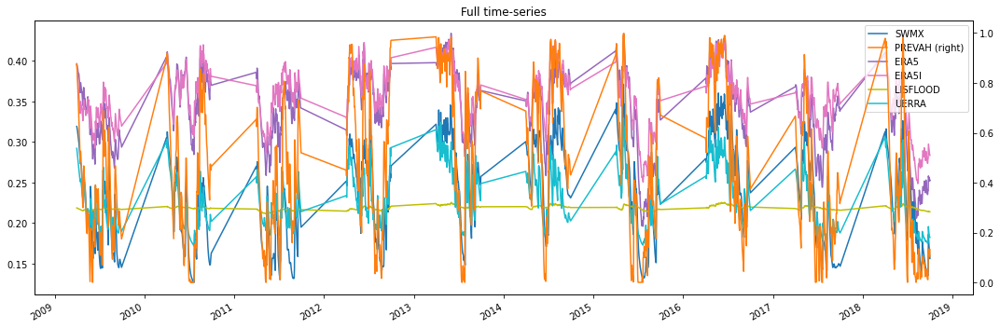

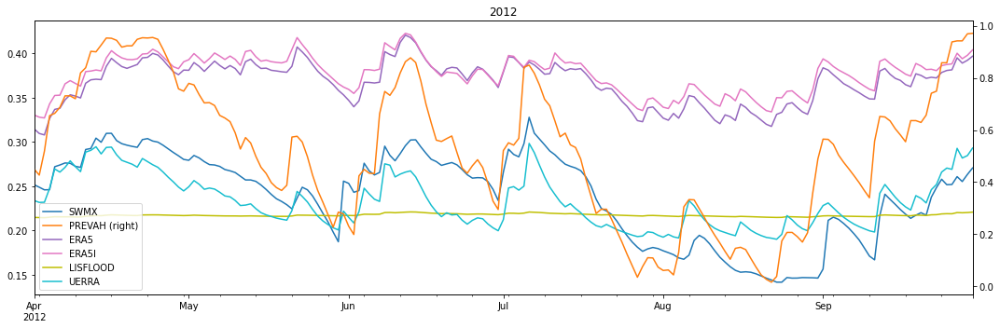

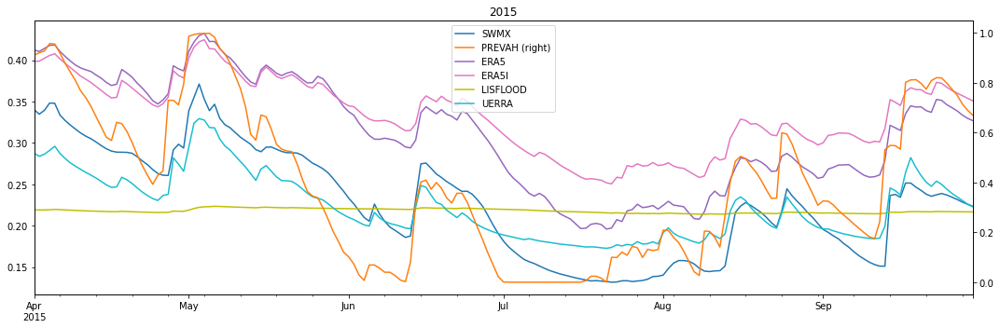

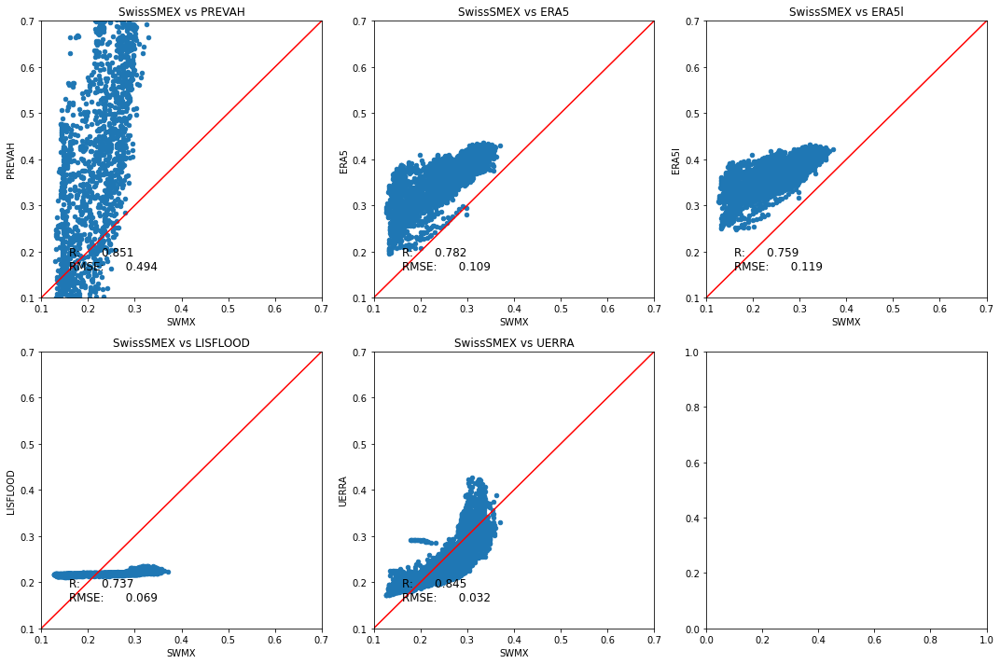

In [4]:
from model_comparison import SwissSMEX_ts_create_plots

# setting
interval = 1
monthly=True
anomalies=False
year = [2012, 2015]

i_swmx = 'PAY'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                                     LISFLOOD,
                                                     UERRA,
                                                     swmx_sites.iloc[0],
                                                     interval,
                                                     year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])
all_stations = merged.copy()
all_stations.columns = mindex

#### Plaffeien

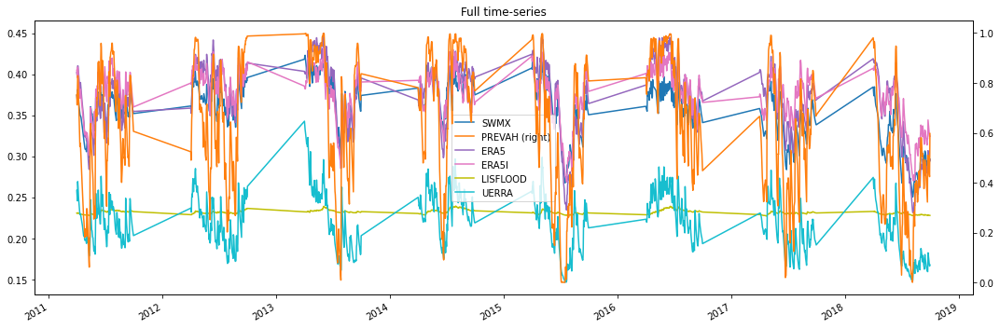

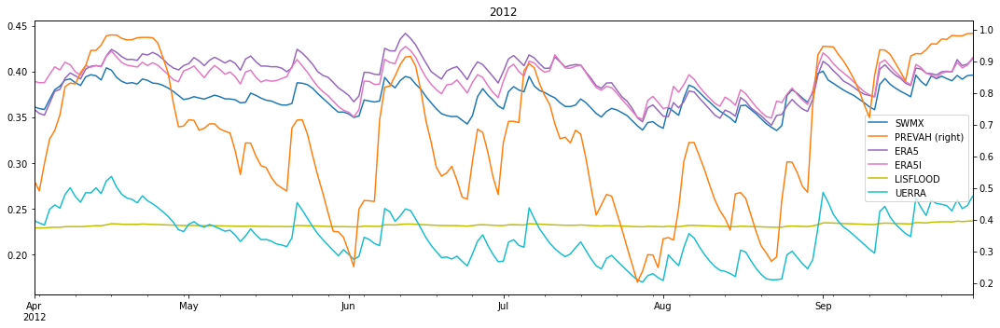

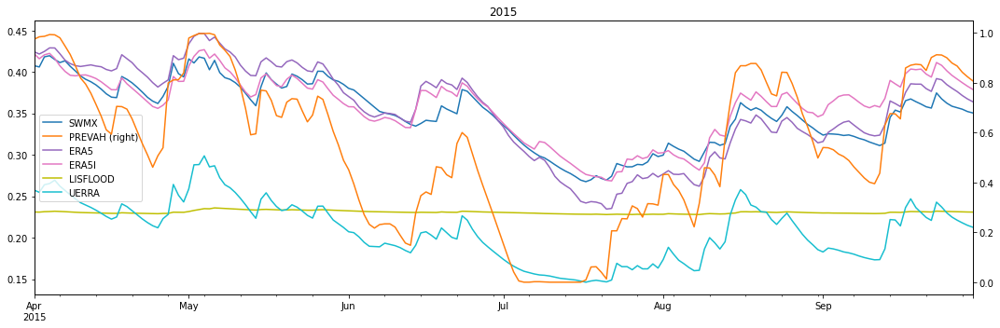

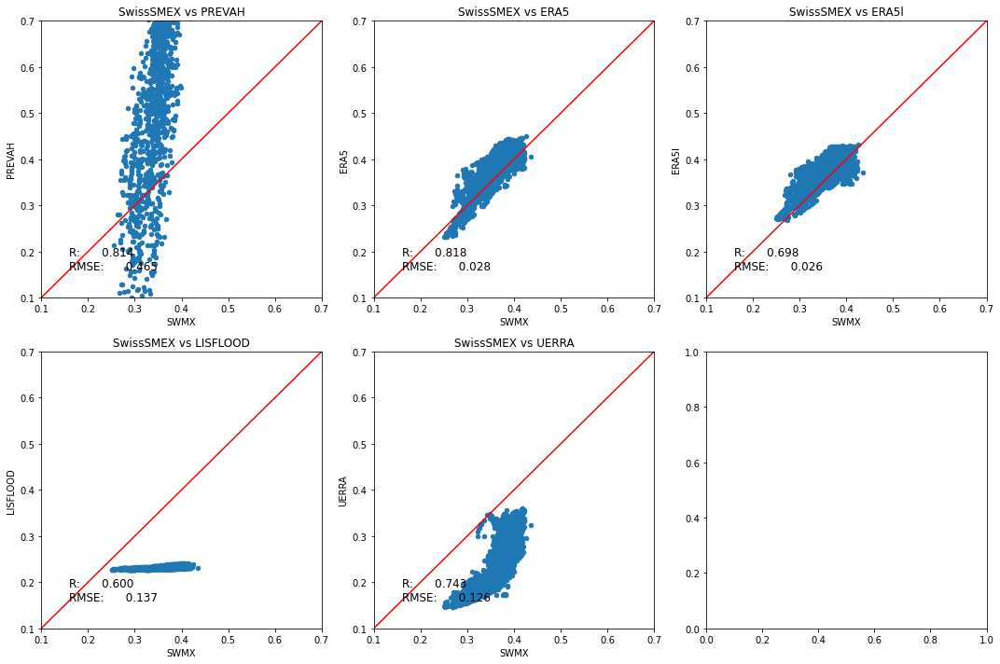

In [5]:
i_swmx = 'PLA'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                        LISFLOOD,
                                        UERRA,
                                        swmx_sites.iloc[1],
                                        interval,
                                        year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Wynau

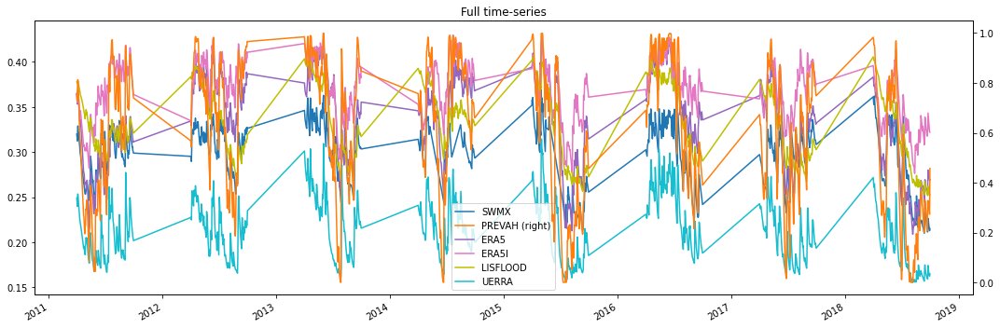

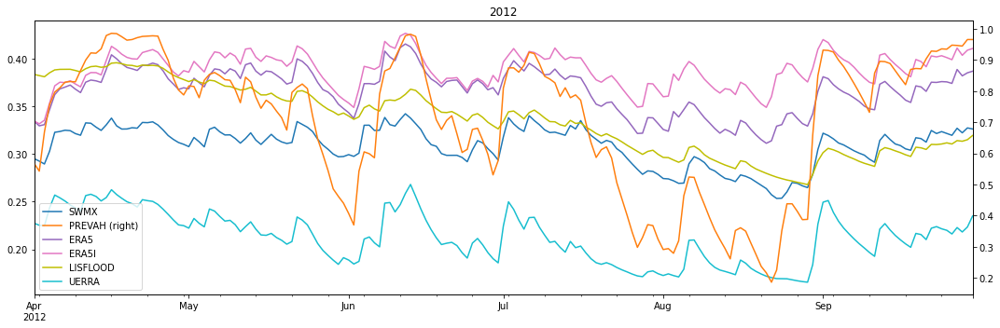

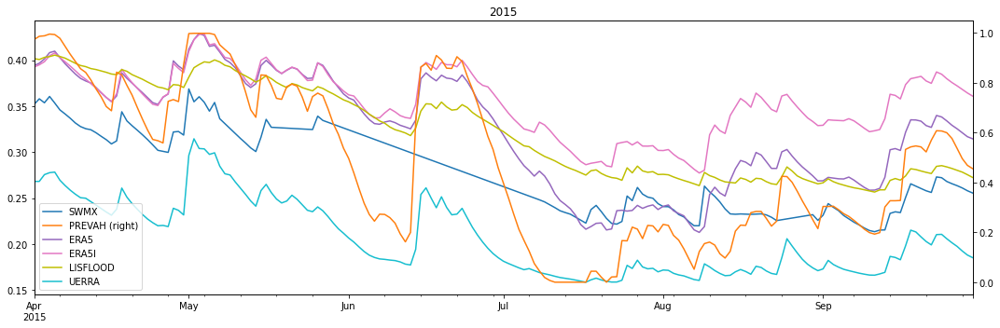

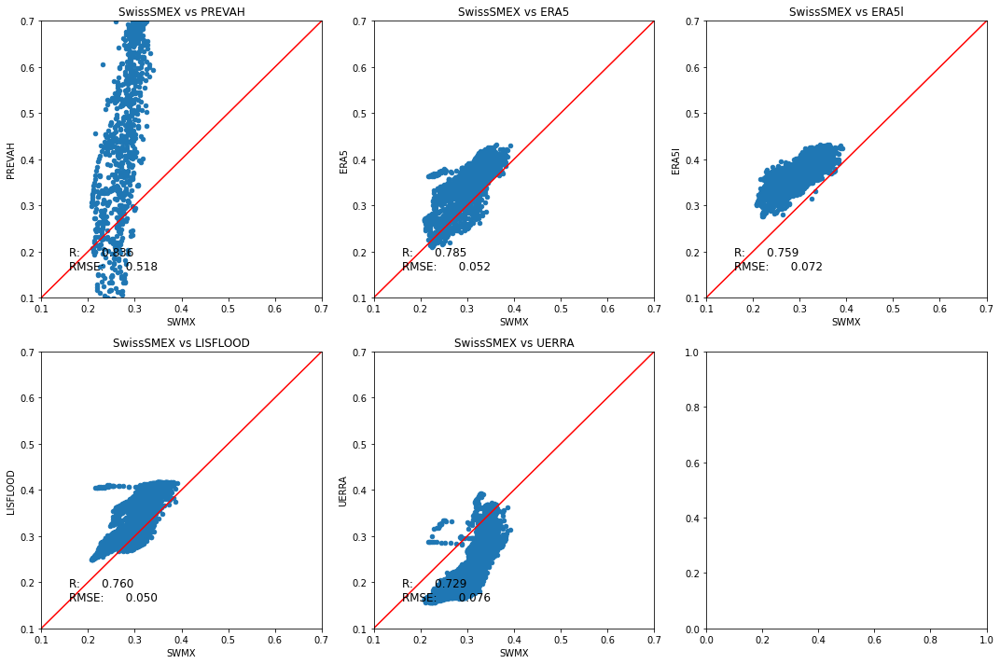

In [6]:
i_swmx = 'WYN'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                        LISFLOOD,
                                        UERRA,
                                        swmx_sites.iloc[2],
                                        interval,
                                        year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Chamau

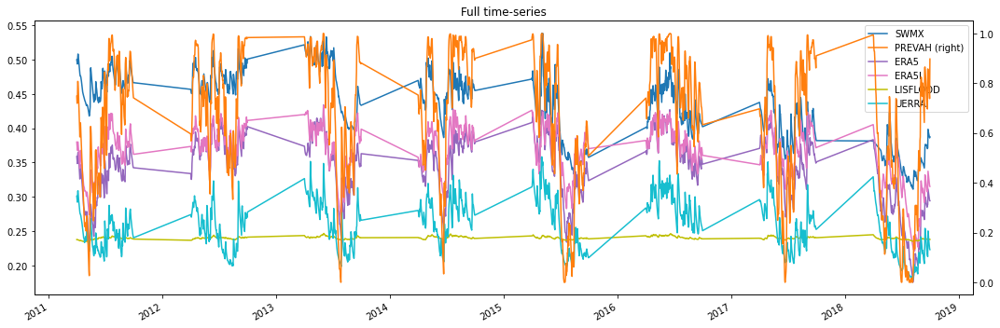

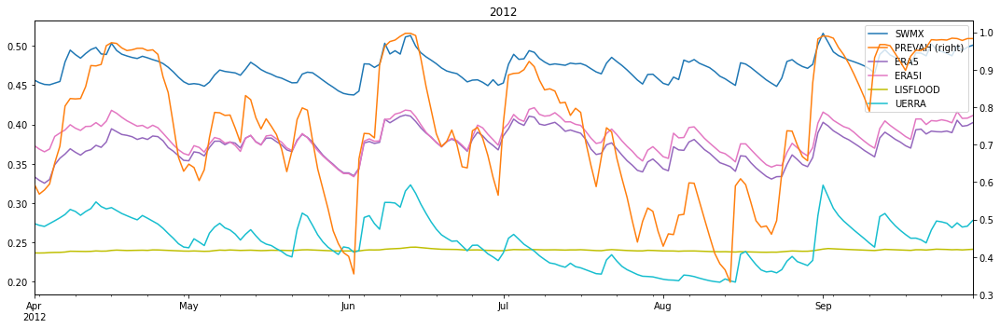

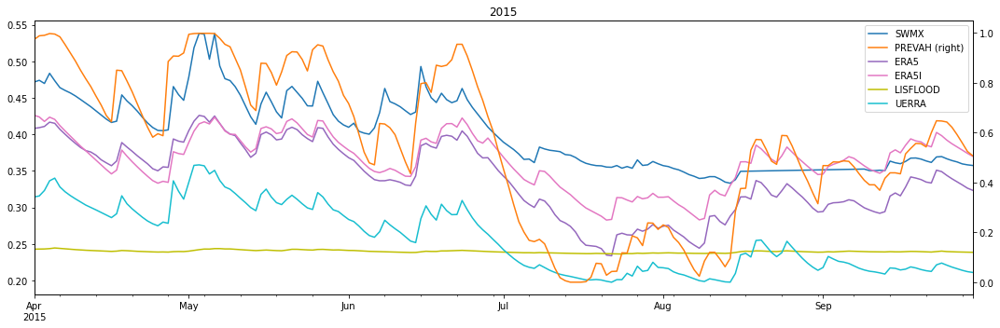

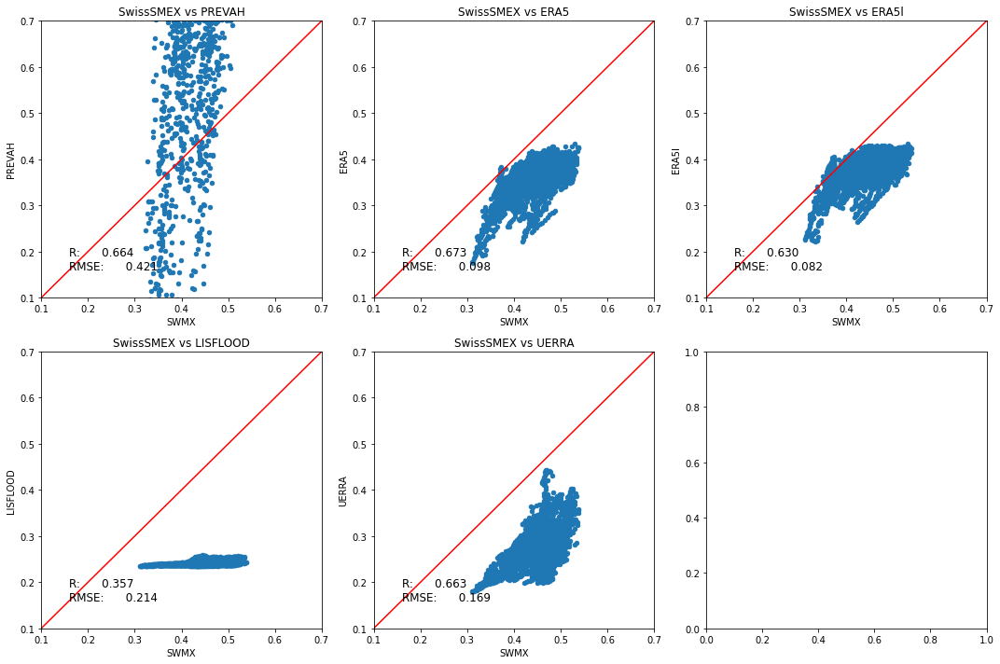

In [7]:
i_swmx = 'CHM'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                        LISFLOOD,
                                        UERRA,
                                        swmx_sites.iloc[3],
                                        interval,
                                        year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Reckenholz

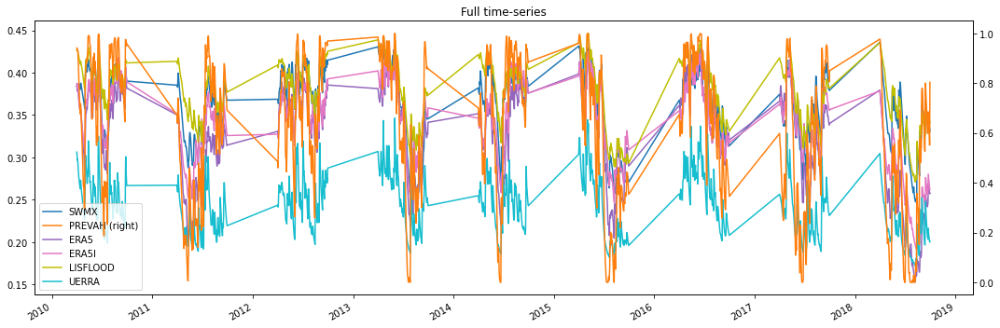

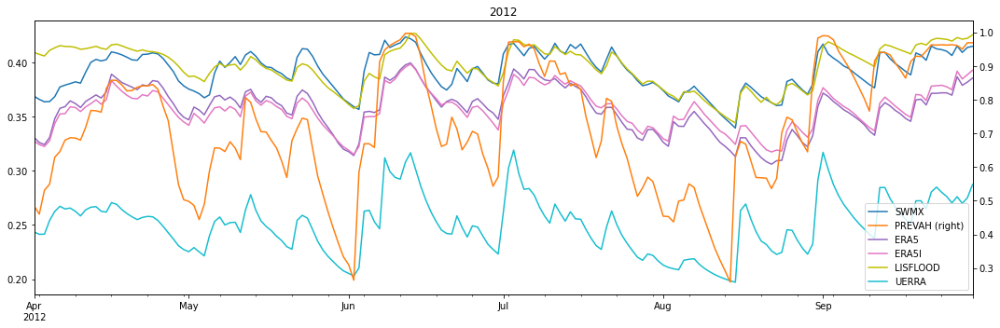

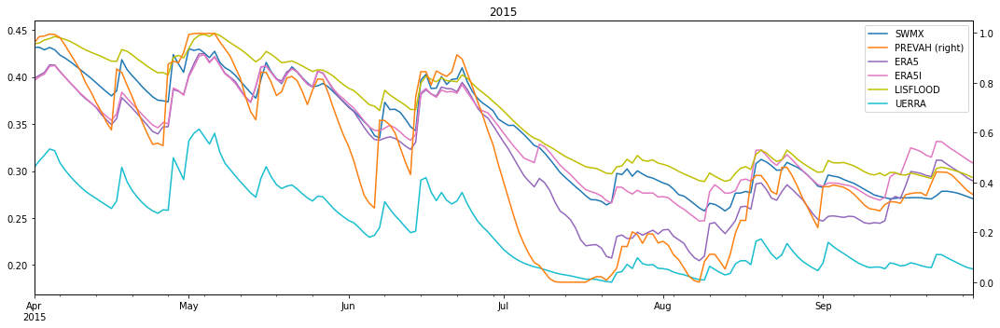

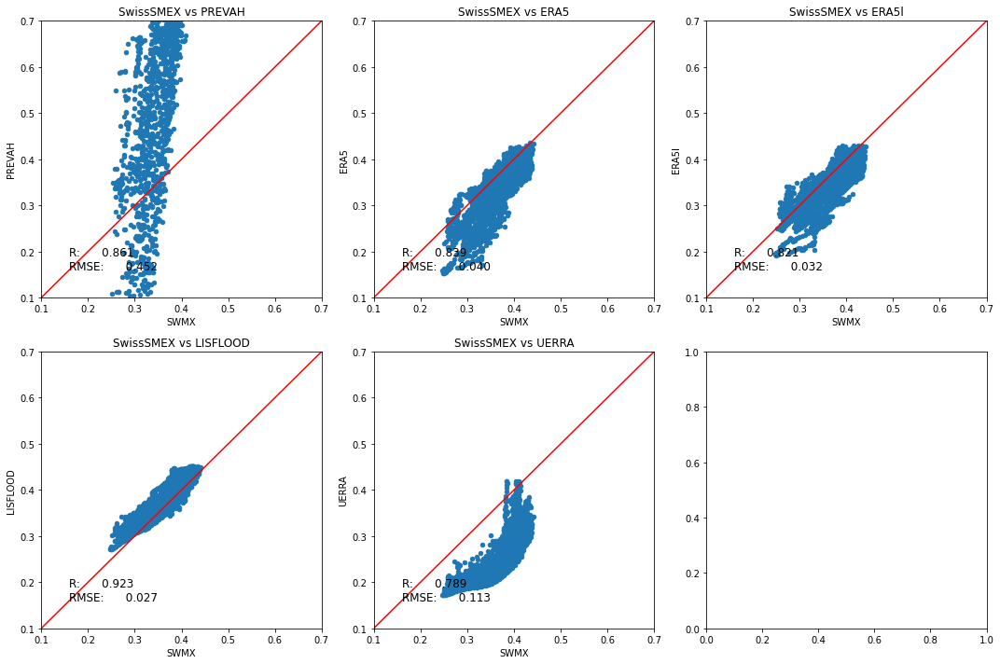

In [8]:
i_swmx = 'REC'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                        LISFLOOD,
                                        UERRA,
                                        swmx_sites.iloc[4],
                                        interval,
                                        year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Taenikon

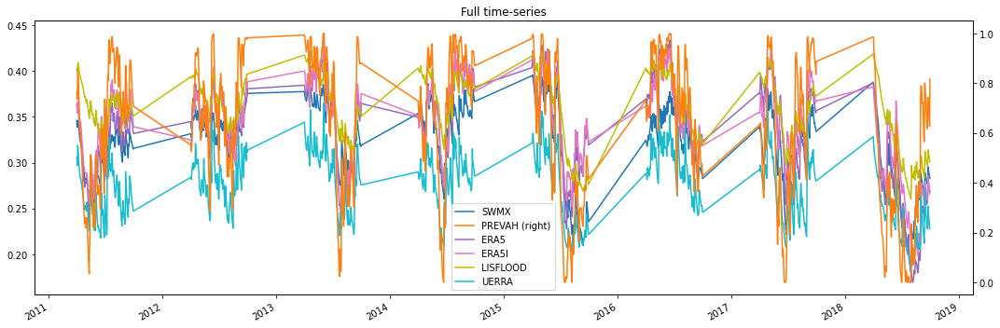

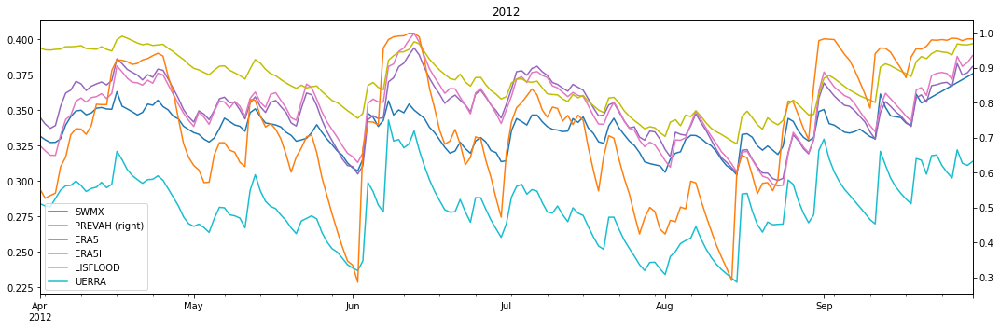

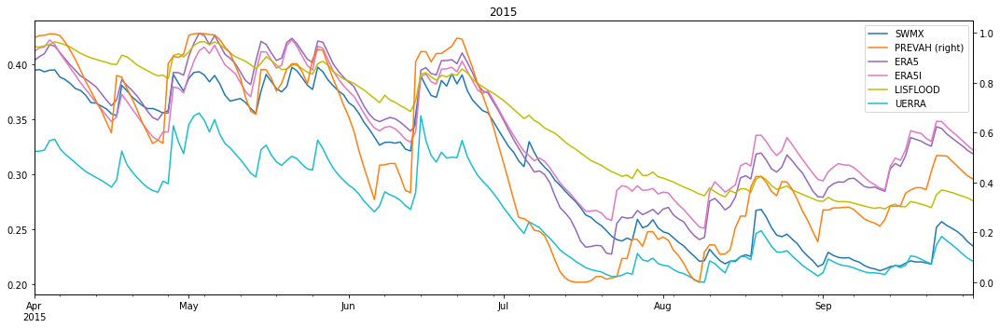

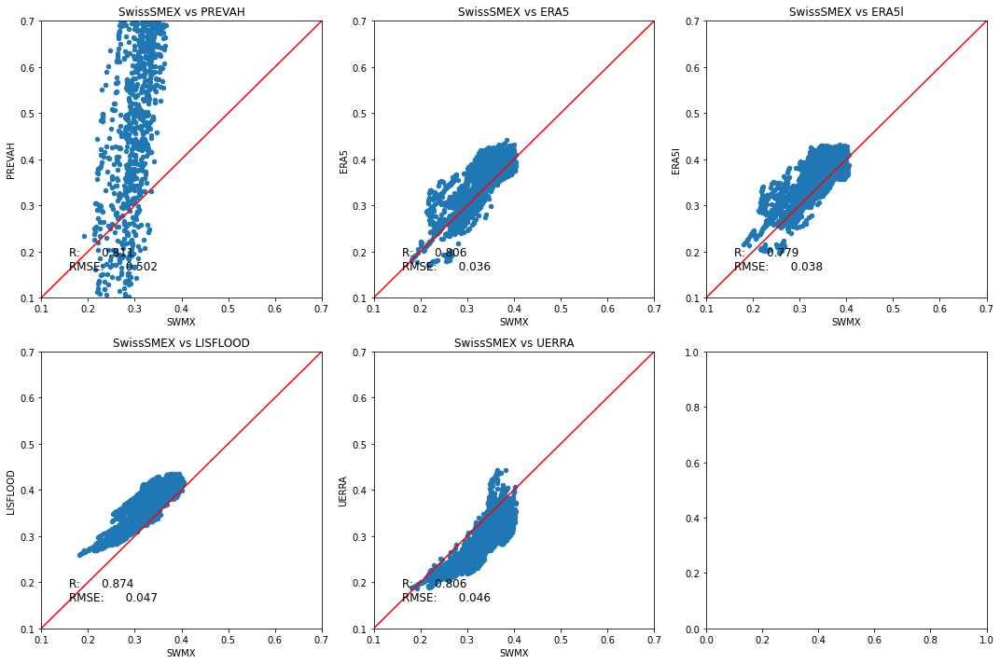

In [9]:
i_swmx = 'TAE'
anom_merged, merged = SwissSMEX_ts_create_plots(ERA5, ERA5l,
                                        LISFLOOD,
                                        UERRA,
                                        swmx_sites.iloc[5],
                                        interval,
                                        year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_swmx, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

### Average Conditions <a class="anchor" id="overall"></a>
The plots below shows the time-series of average soil moisture

#### Time-series

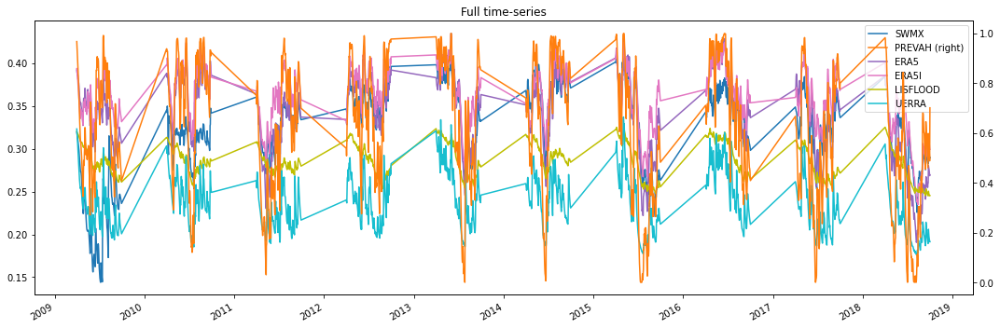

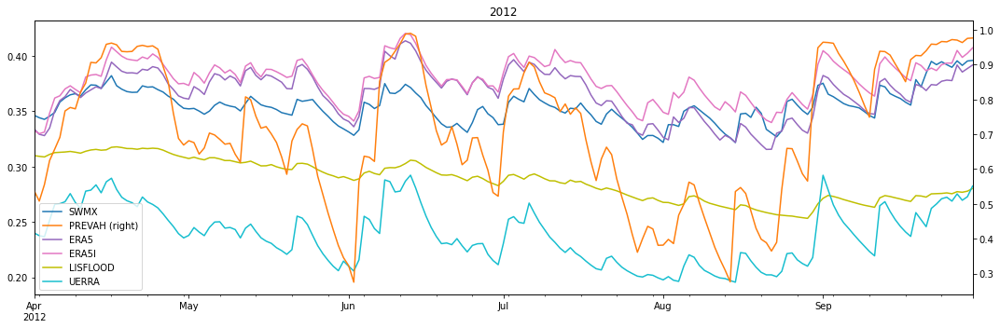

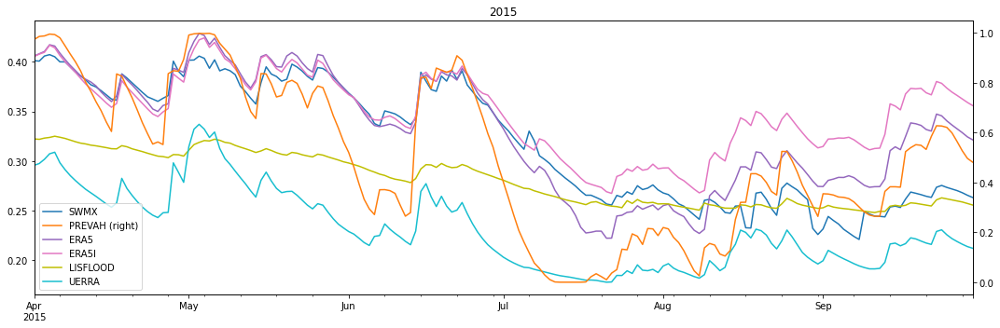

In [10]:
from model_comparison import plot_only_ts
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.transforms as mtrasnforms
import numpy as np

avg_stations = all_stations.groupby(level=1, axis=1).median()
anom_merged = plot_only_ts(avg_stations[
                               ['SWMX', 'PREVAH', 'ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']
                           ], '', 'Average', year=[2012, 2015], anomalies=anomalies, monthly=True)

#### Scatterplots

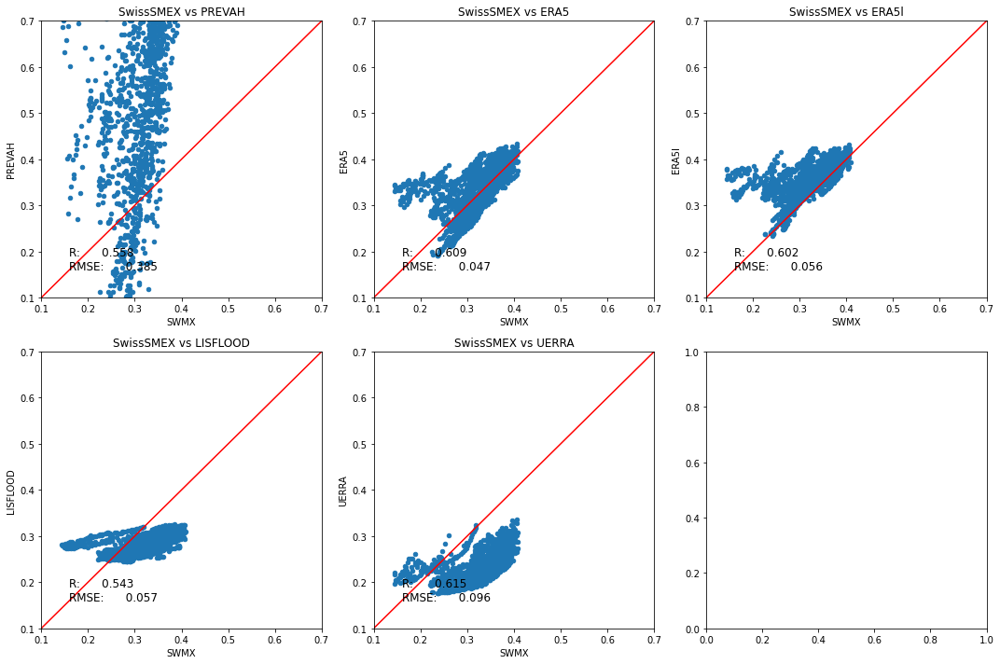

In [11]:
# create scatterplot
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
collist = ['PREVAH', 'ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']

scattermerged = anom_merged

# scattermerged[scattermerged.isnull().any(axis=1)] = np.nan
scattermerged = scattermerged.dropna(axis=0)

pearsonr = scattermerged.corr()

for i in range(5):
    if anomalies:
        plotlims = [-2.5, 2.5]
    else:
        plotlims = [0.1, 0.7]
    scattermerged.plot.scatter(x='SWMX', y=collist[i], ax=axs[np.unravel_index(i, (2, 3))],
                               title='SwissSMEX vs ' + collist[i],
                               xlim=plotlims, ylim=plotlims)
    # calculate rmse
    rmse = ((scattermerged[collist[i]] - scattermerged['SWMX']) ** 2).mean() ** .5
    axs[np.unravel_index(i, (2, 3))].text(0.1, 0.1,
                                          "R: " + "{:10.3f}".format(pearsonr['SWMX'][collist[i]]) + '\n' +
                                          "RMSE: " + "{:10.3f}".format(rmse),
                                          transform=axs[np.unravel_index(i, (2, 3))].transAxes,
                                          size='large')
    line = mlines.Line2D([0, 1], [0, 1], color='red')
    transform = axs[np.unravel_index(i, (2, 3))].transAxes
    line.set_transform(transform)
    axs[np.unravel_index(i, (2, 3))].add_line(line)

fig.tight_layout()

### Individual SMOSMANIA stations <a class="anchor" id="smosmania_ind"></a>
#### CabrieresdAvignon

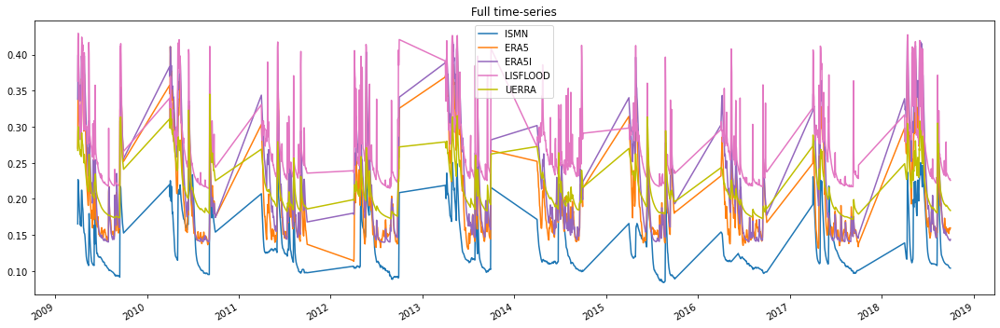

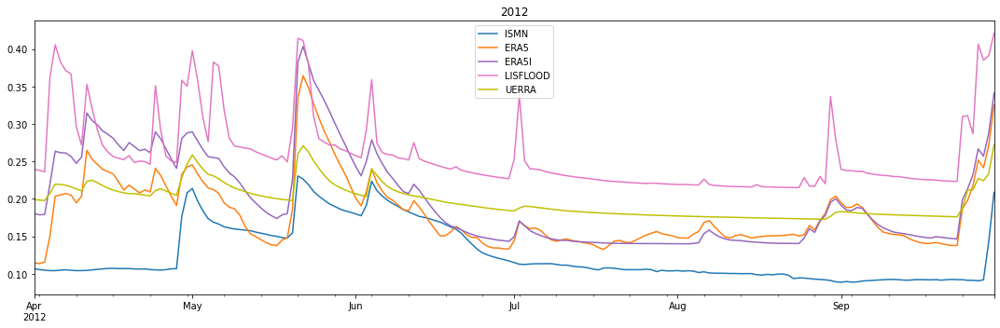

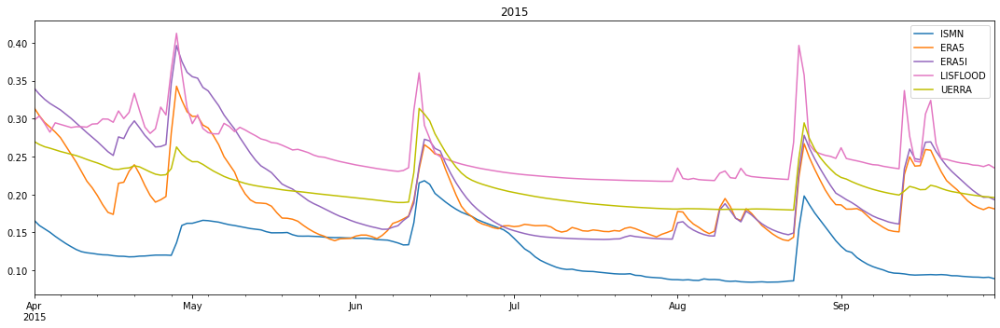

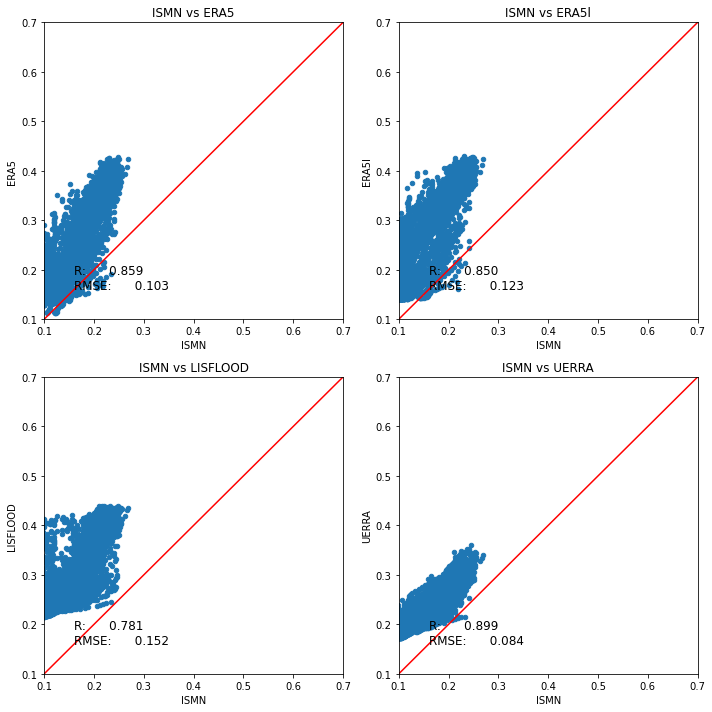

In [12]:
from model_comparison import ISMN_ts_validation

# settings
interval = 1
monthly=True
anomalies=False
year = [2012, 2015]

i_station = "CabrieresdAvignon"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])
all_stations = merged.copy()
all_stations.columns = mindex

#### Villevielle

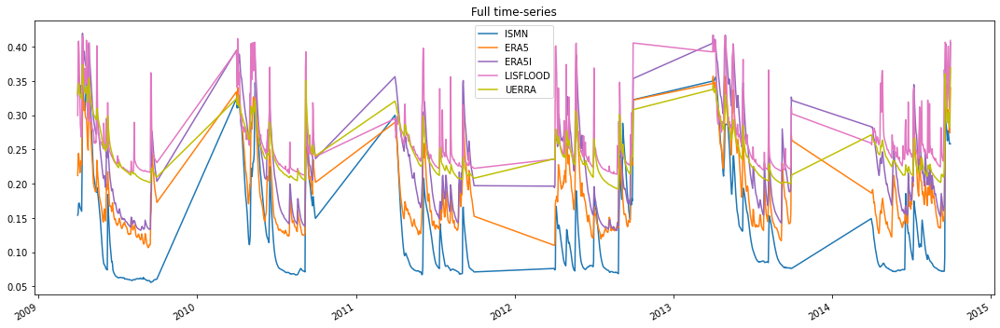

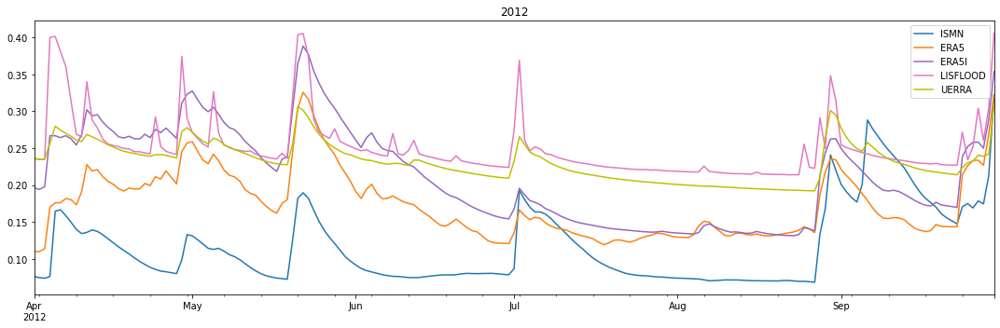

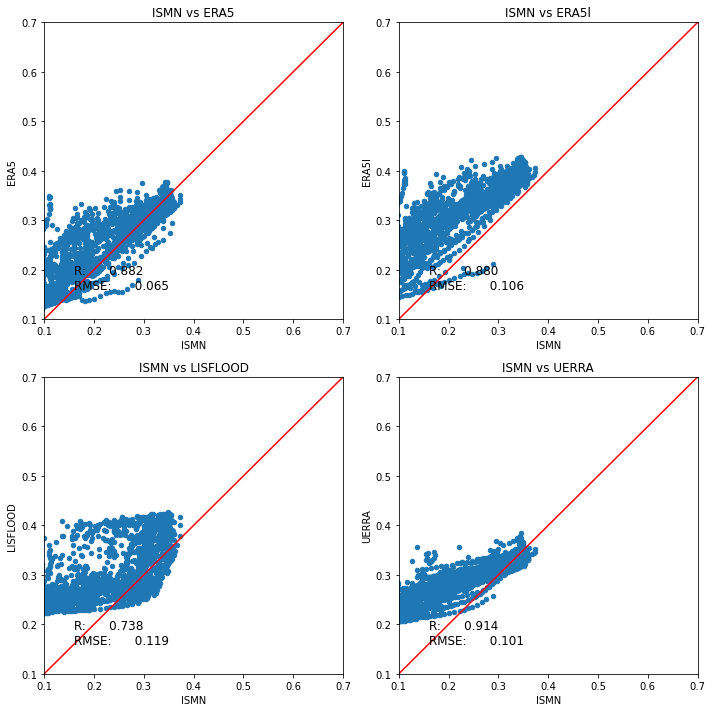

In [13]:
i_station = "Villevielle"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### LaGrandCombe

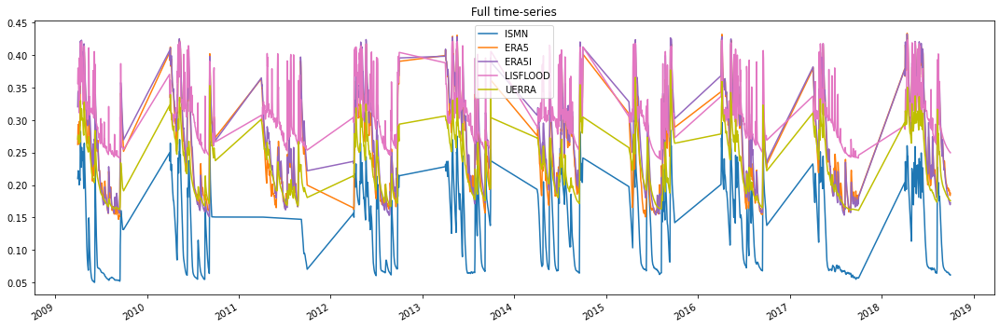

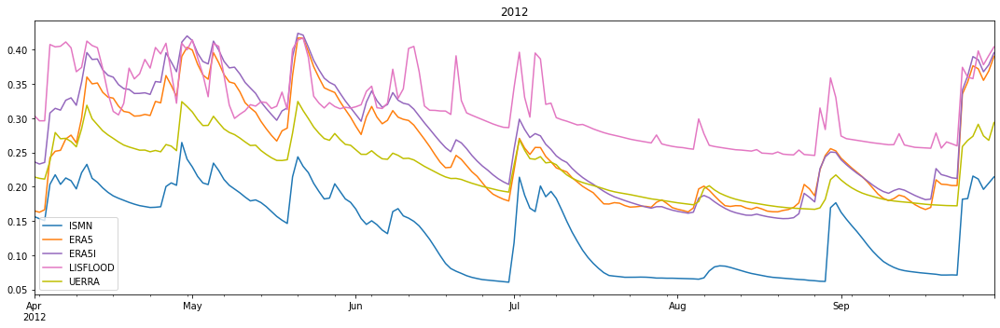

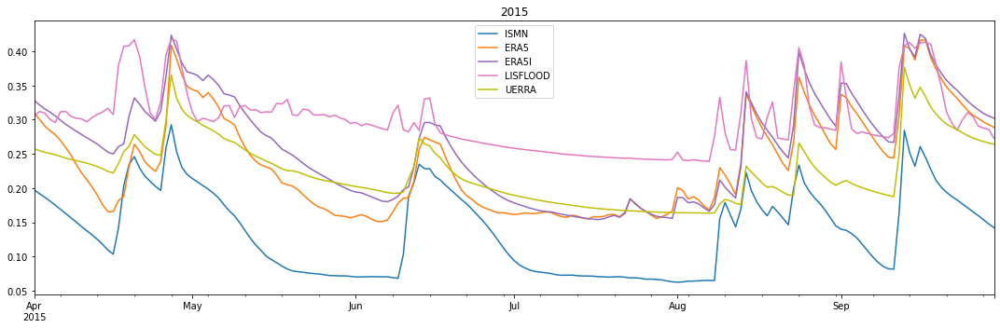

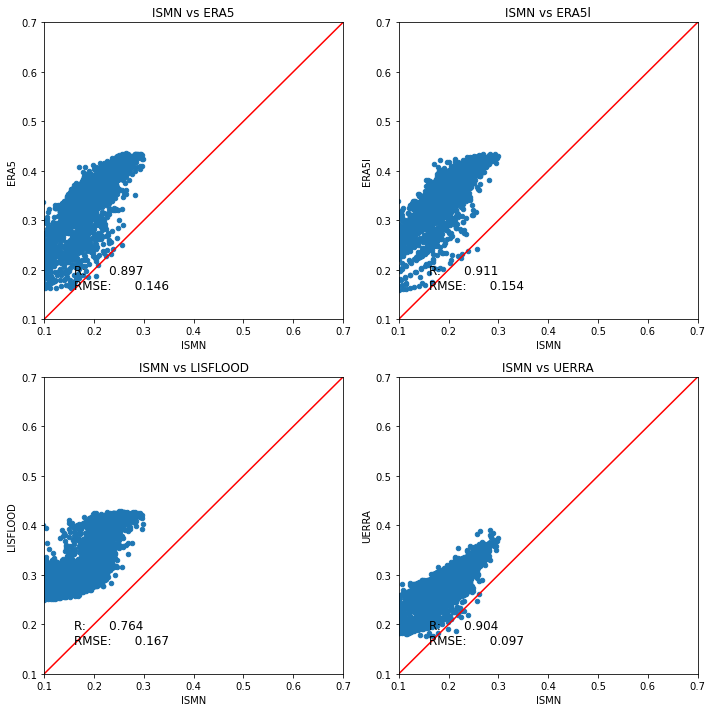

In [14]:
i_station = "LaGrandCombe"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Mejannes-le-Clap

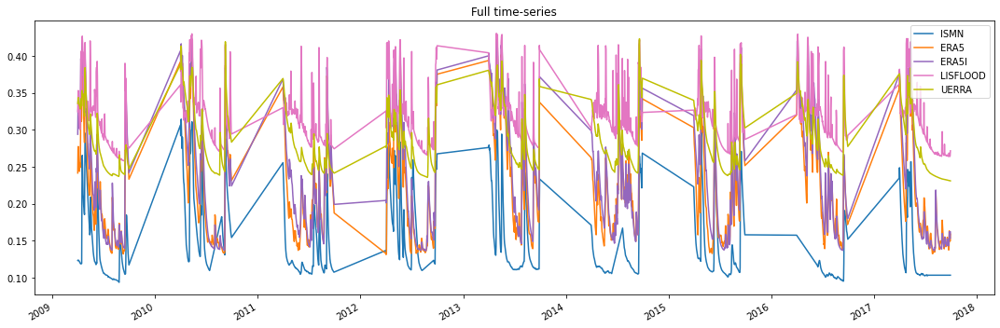

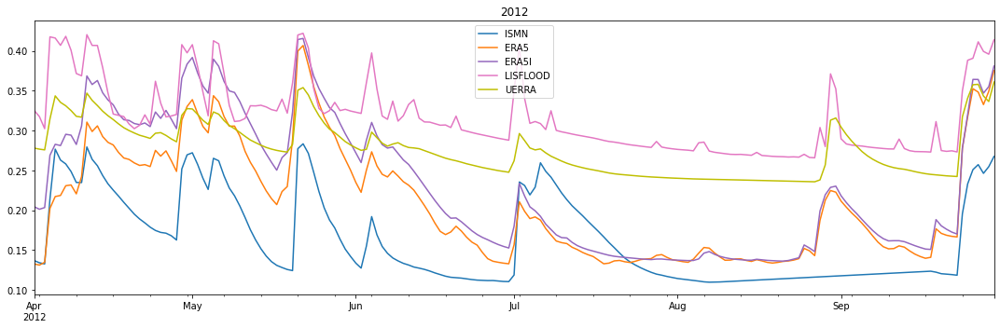

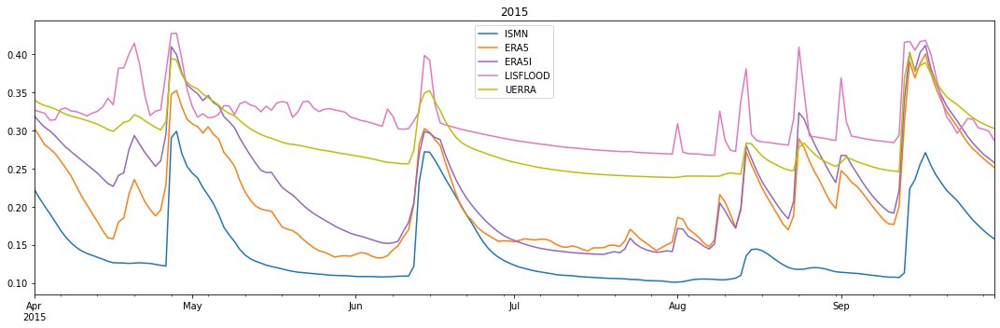

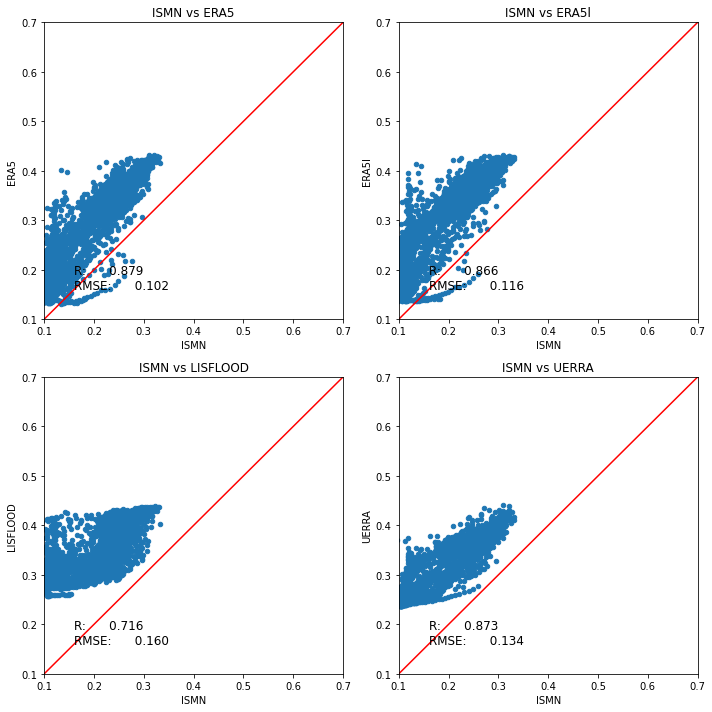

In [15]:
i_station = "Mejannes-le-Clap"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)


#### Barnas

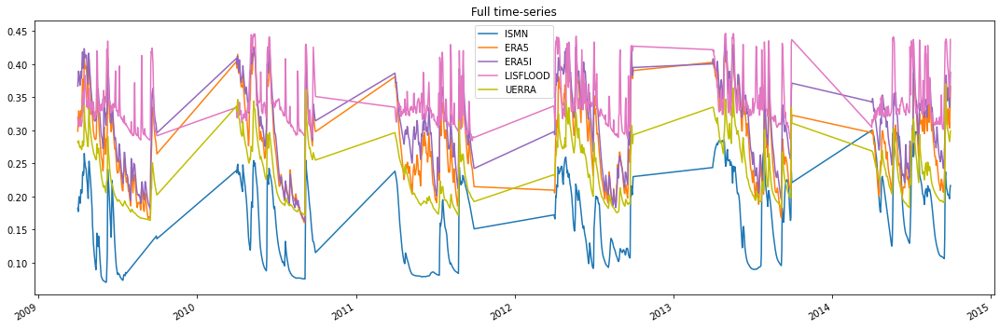

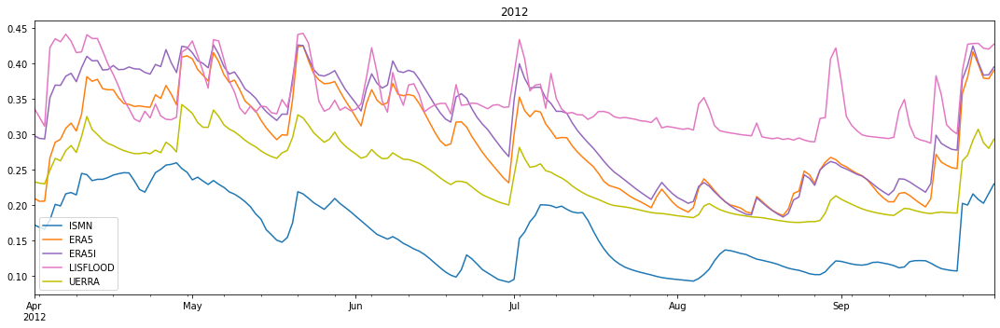

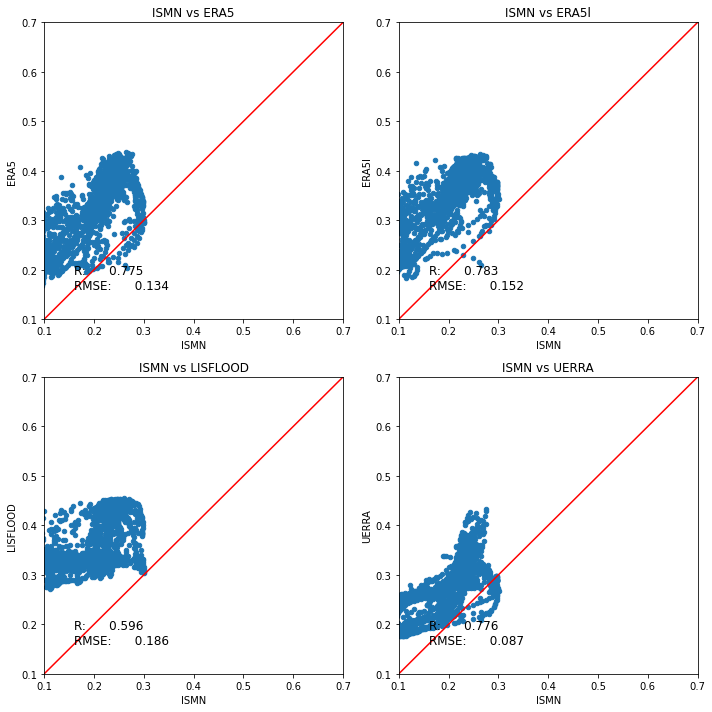

In [16]:
i_station = "Barnas"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### Mazan-Abbaye

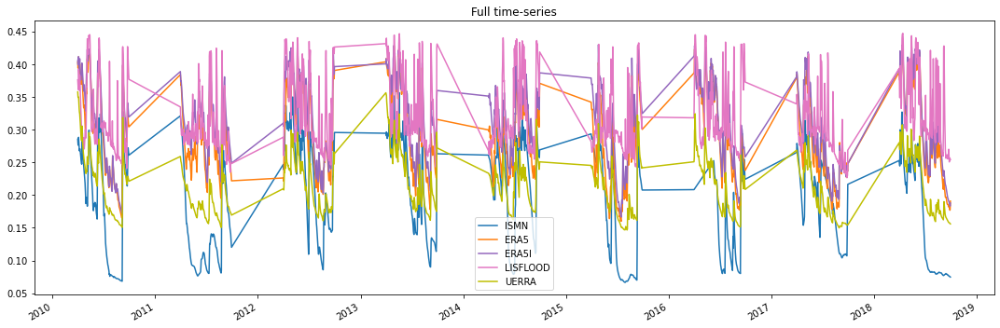

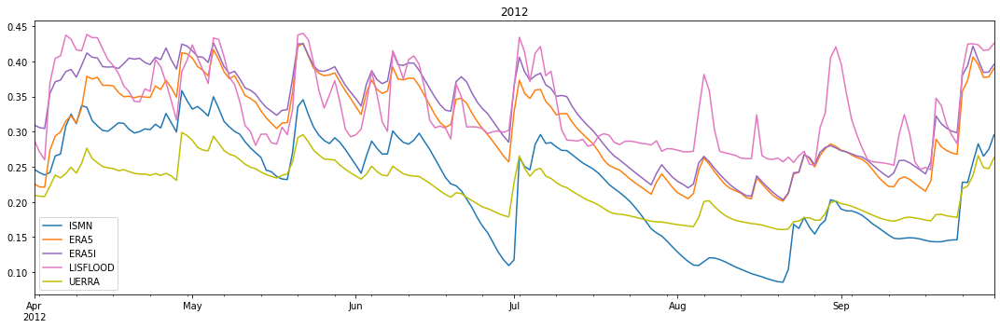

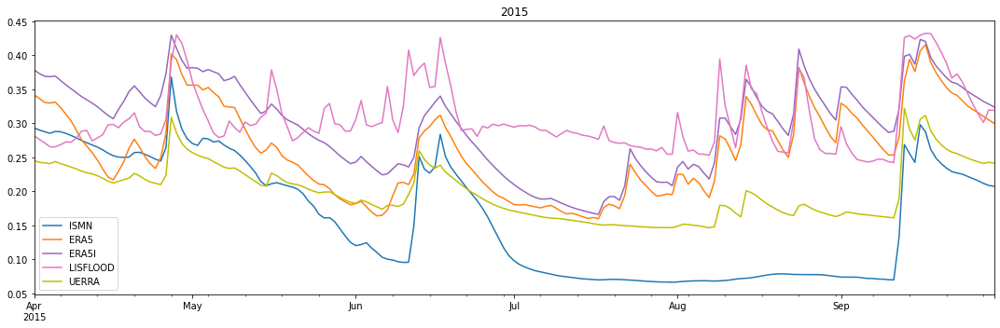

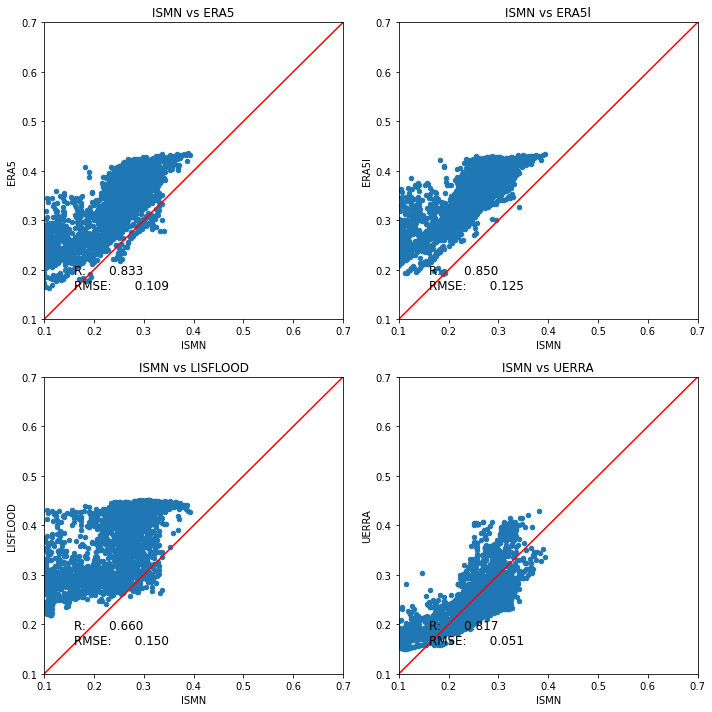

In [17]:
i_station = "Mazan-Abbaye"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "SMOSMANIA",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

### Average Conditions SMOSMANIA <a class="anchor" id="smosmania_overall"></a>
The plots below shows the time-series of average soil moisture

#### Time-series

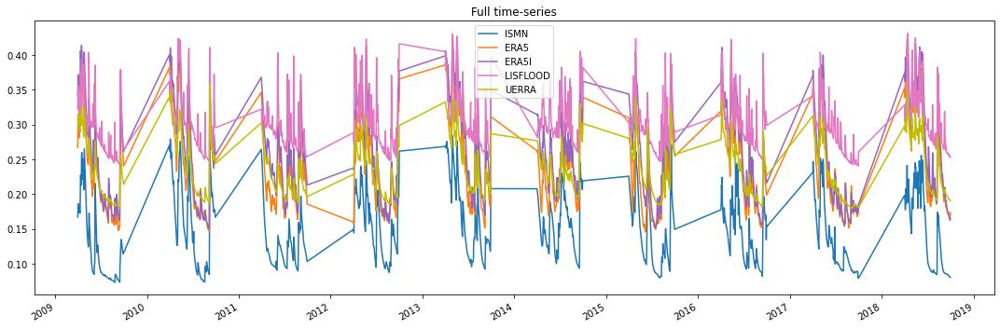

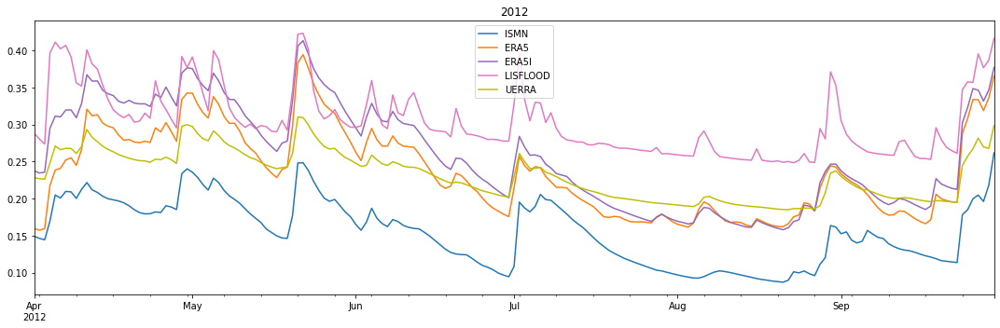

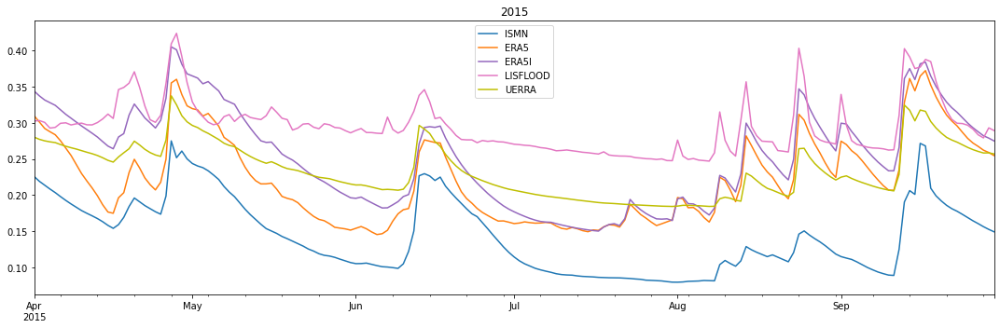

In [18]:
from model_comparison import plot_only_ts
import matplotlib.pyplot as plt
import numpy as np

avg_stations = all_stations.groupby(level=1, axis=1).mean()
anom_merged = plot_only_ts(avg_stations[
                               ['ISMN', 'ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']
                           ], '', 'Average', year=[2012, 2015], anomalies=anomalies, monthly=True)

#### Scatterplots

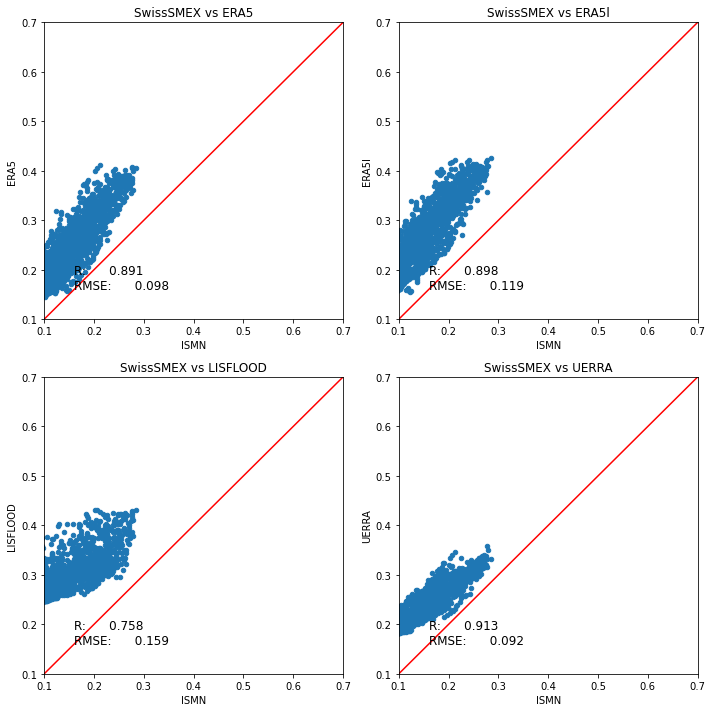

In [19]:
# create scatterplot
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
collist = ['ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']

scattermerged = anom_merged

# scattermerged[scattermerged.isnull().any(axis=1)] = np.nan
scattermerged = scattermerged.dropna(axis=0)

pearsonr = scattermerged.corr()

for i in range(4):
    if anomalies:
        plotlims = [-2.5, 2.5]
    else:
        plotlims = [0.1, 0.7]
    scattermerged.plot.scatter(x='ISMN', y=collist[i], ax=axs[np.unravel_index(i, (2, 2))],
                               title='SwissSMEX vs ' + collist[i],
                               xlim=plotlims, ylim=plotlims)
    # calculate rmse
    rmse = ((scattermerged[collist[i]] - scattermerged['ISMN']) ** 2).mean() ** .5
    axs[np.unravel_index(i, (2, 2))].text(0.1, 0.1,
                                          "R: " + "{:10.3f}".format(pearsonr['ISMN'][collist[i]]) + '\n' +
                                          "RMSE: " + "{:10.3f}".format(rmse),
                                          transform=axs[np.unravel_index(i, (2, 2))].transAxes,
                                          size='large')
    line = mlines.Line2D([0, 1], [0, 1], color='red')
    transform = axs[np.unravel_index(i, (2, 2))].transAxes
    line.set_transform(transform)
    axs[np.unravel_index(i, (2, 2))].add_line(line)

fig.tight_layout()

### Individual WEGENERNET stations <a class="anchor" id="wegener_ind"></a>
#### 19

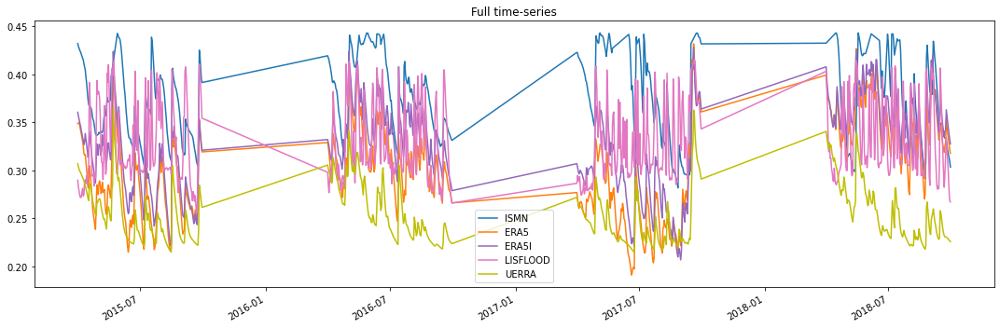

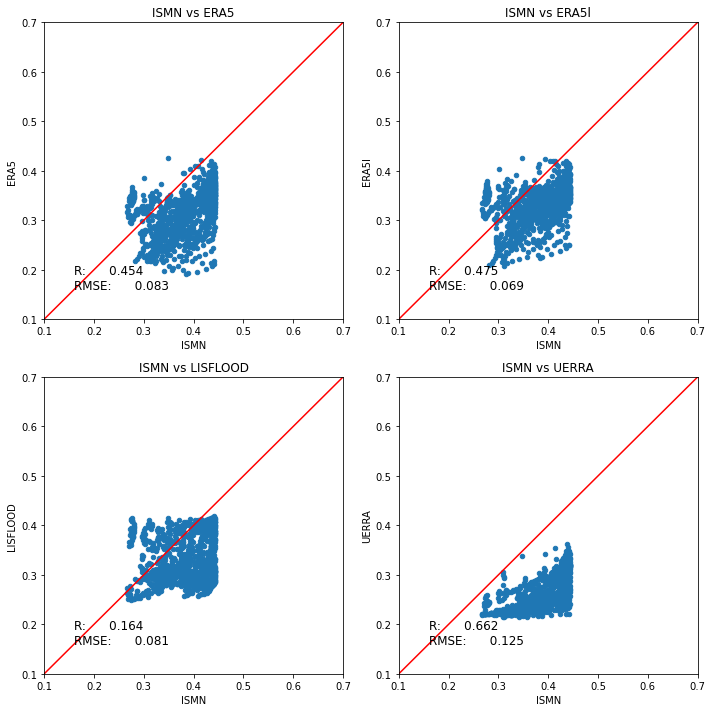

In [20]:
from model_comparison import ISMN_ts_validation

# settings
interval = 1
monthly=True
anomalies=False
year = [2012, 2015]

i_station = "19"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=None, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])
all_stations = merged.copy()
all_stations.columns = mindex

#### 27

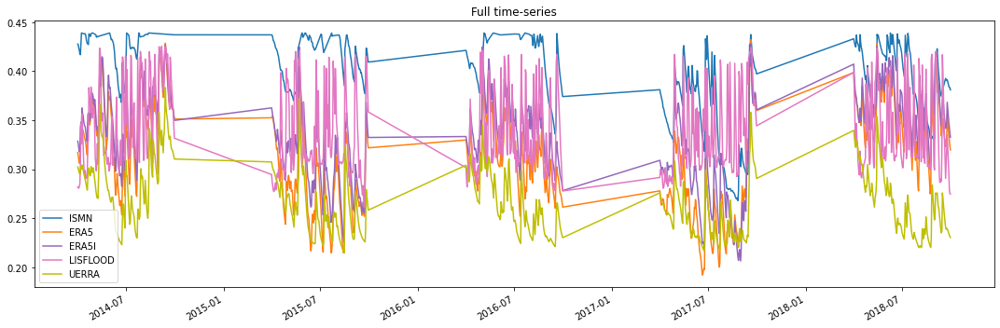

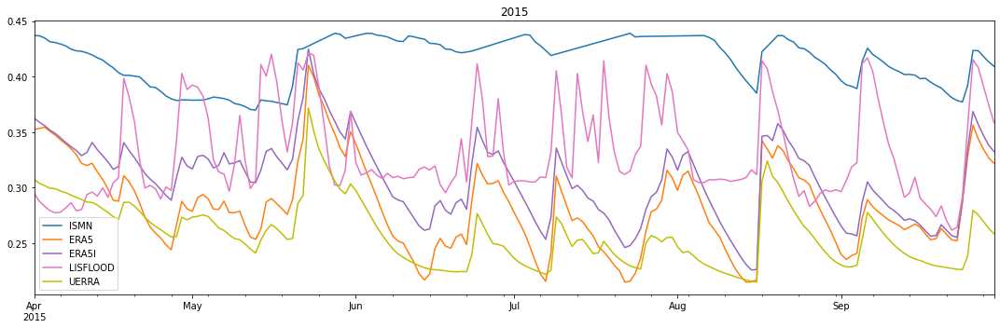

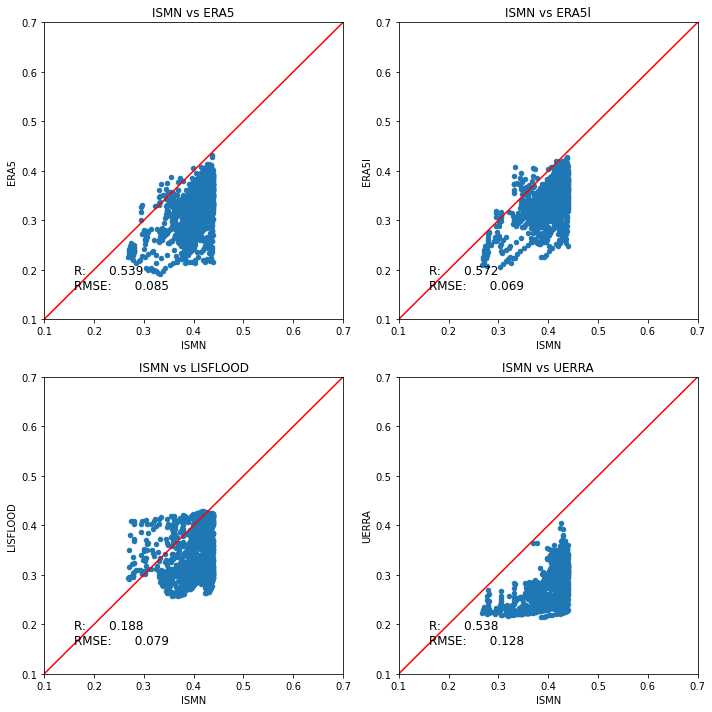

In [21]:
i_station = "27"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### 34

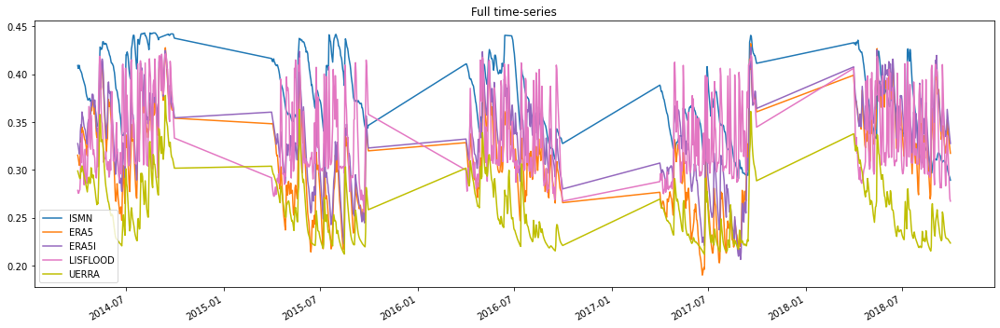

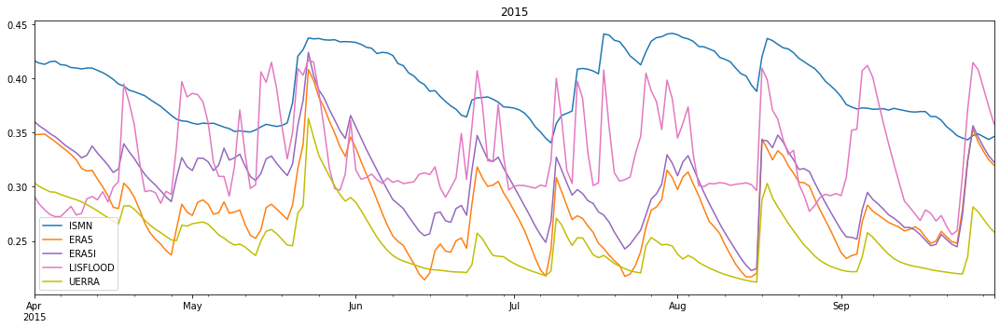

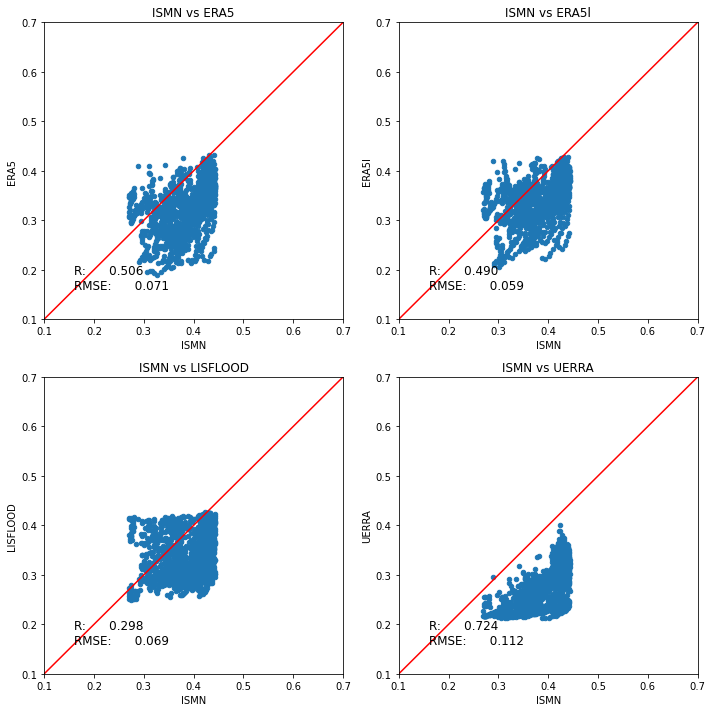

In [22]:
i_station = "34"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### 50

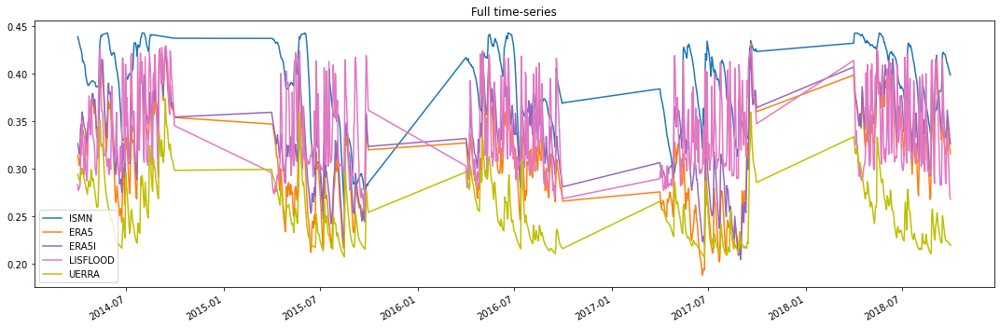

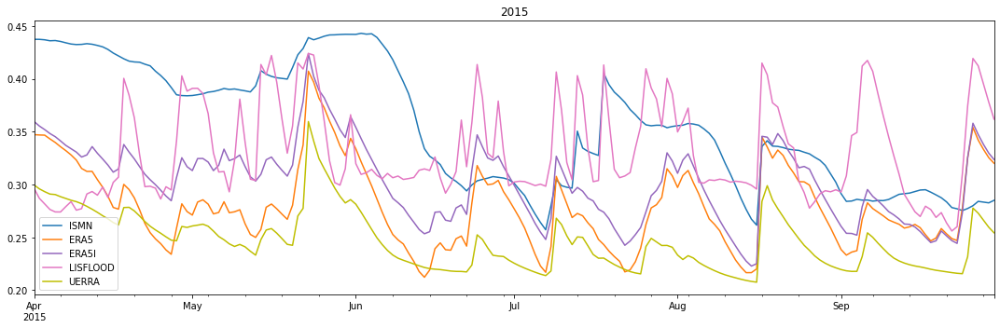

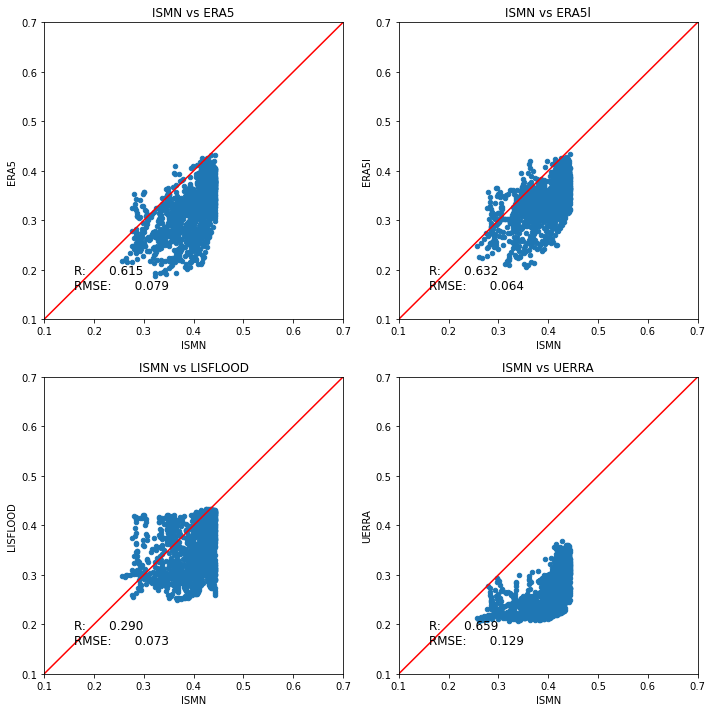

In [23]:
i_station = "50"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### 77

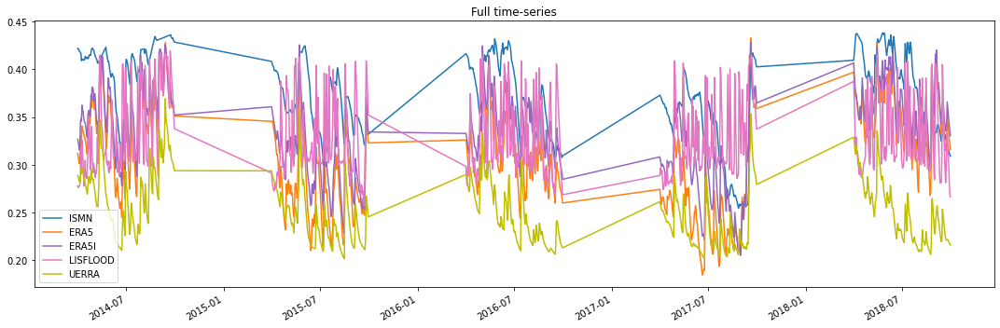

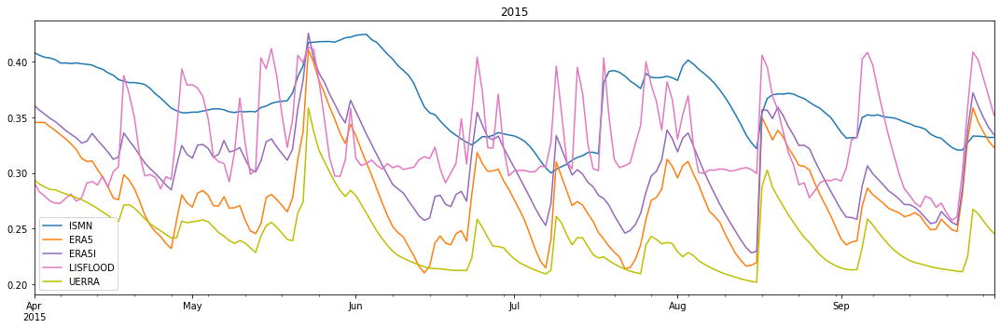

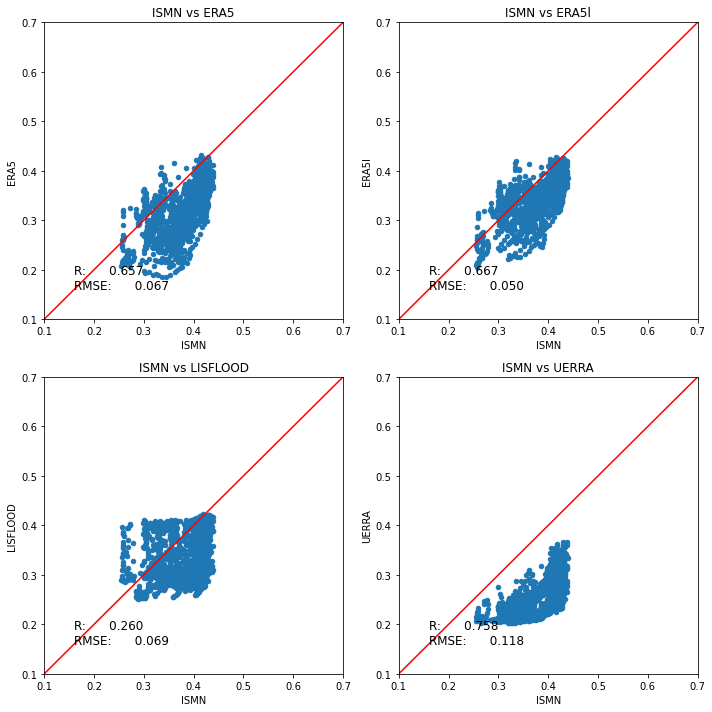

In [24]:
i_station = "77"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### 84

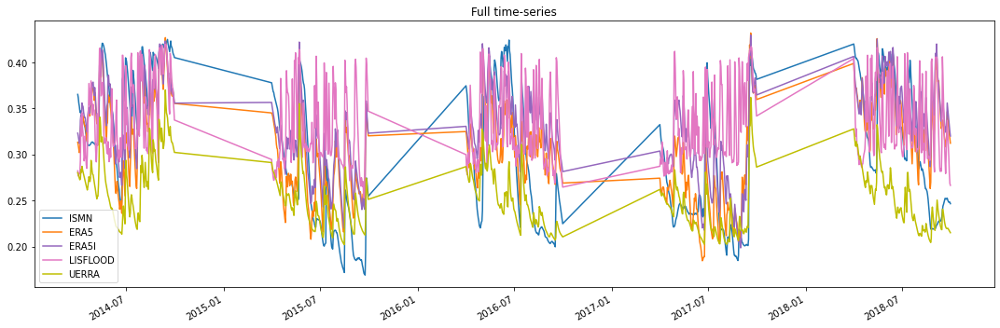

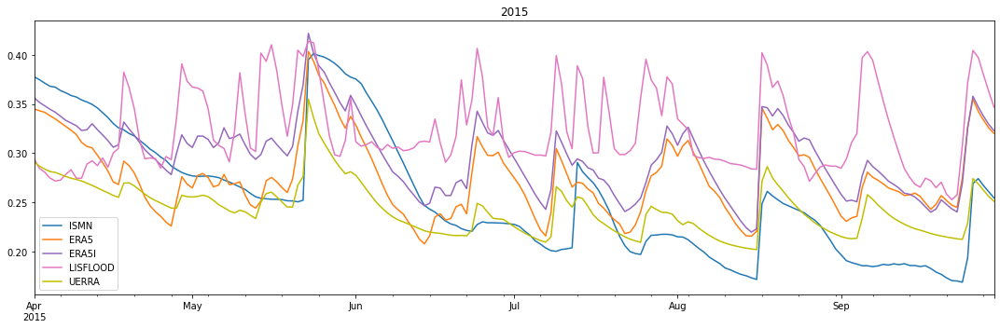

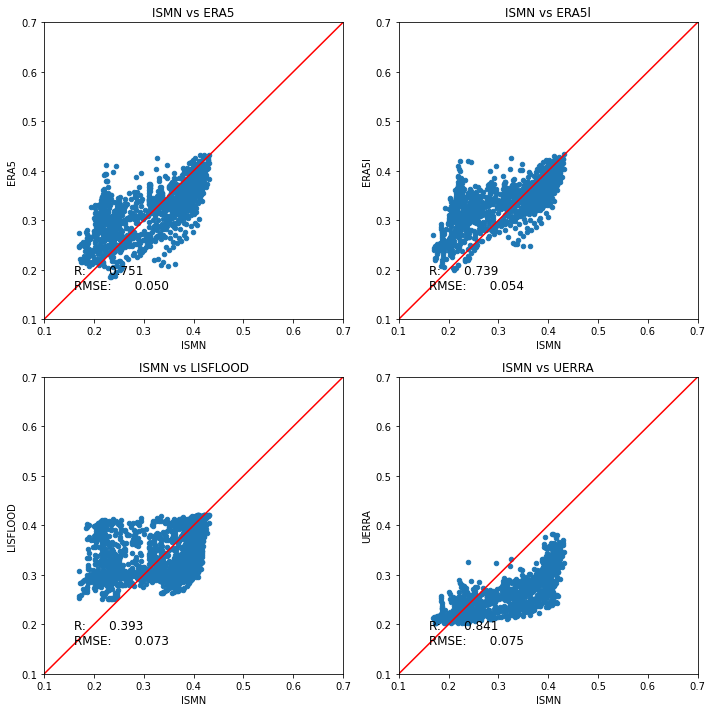

In [25]:
i_station = "84"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### 85

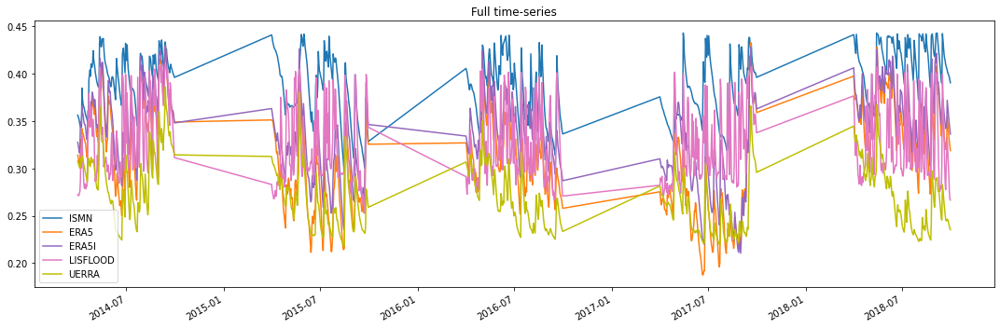

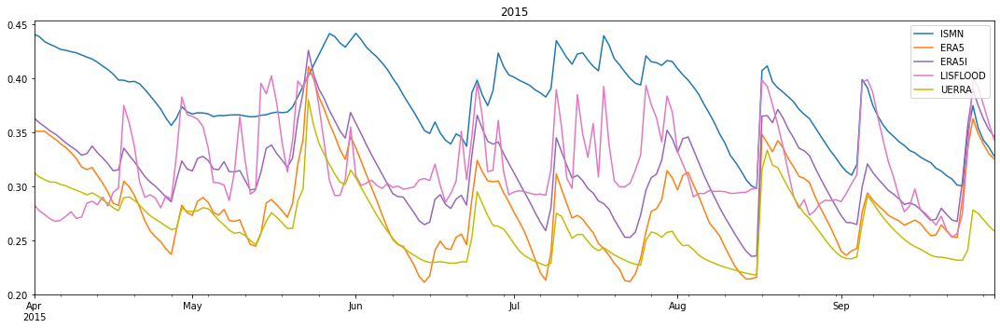

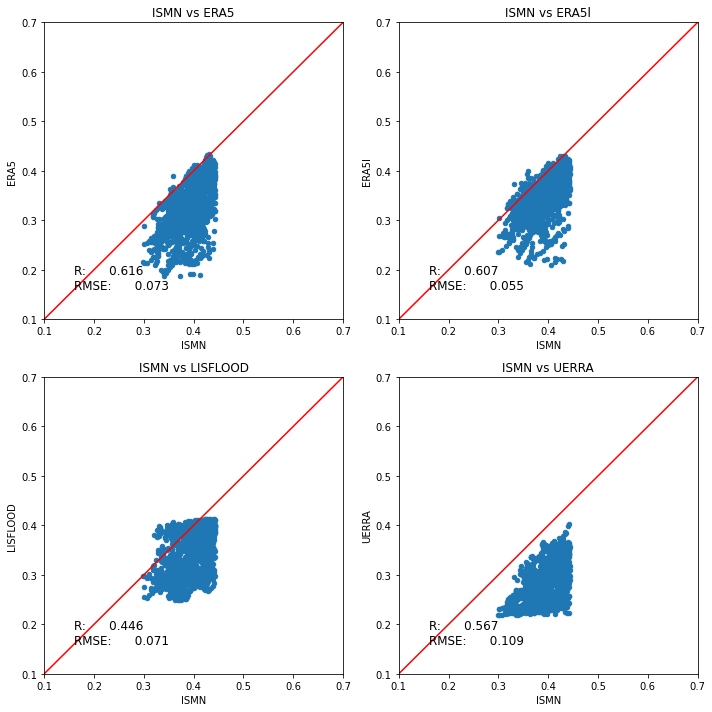

In [26]:
i_station = "85"
anom_merged, merged = ISMN_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         "WEGENERNET",
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

### Average Conditions Wegenernet <a class="anchor" id="wegenernet_overall"></a>
The plots below shows the time-series of average soil moisture

#### Time-series

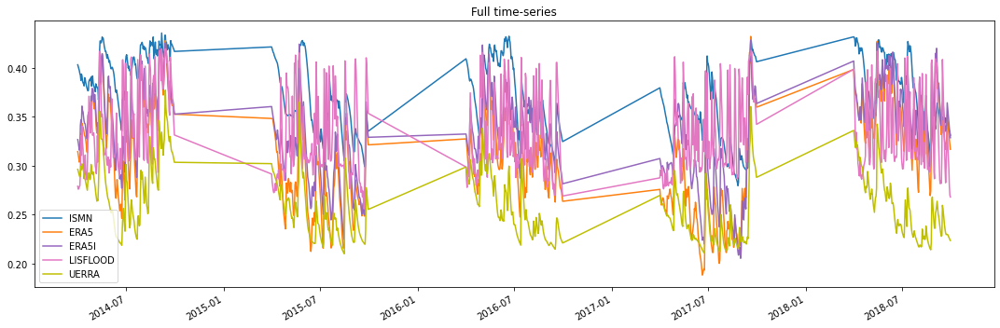

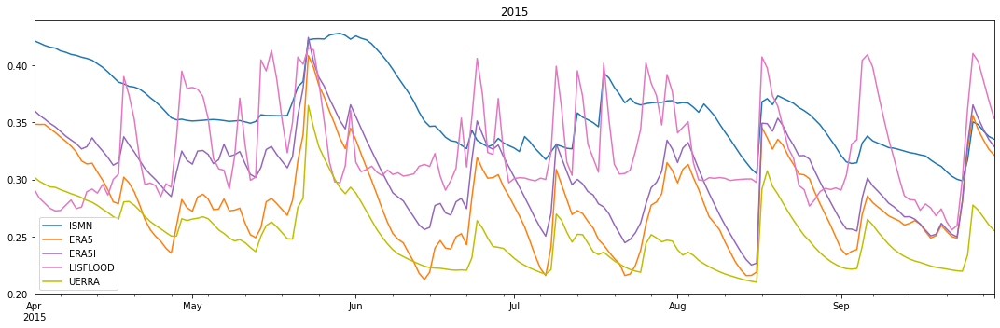

In [27]:
from model_comparison import plot_only_ts
import matplotlib.pyplot as plt
import numpy as np

avg_stations = all_stations.groupby(level=1, axis=1).mean()
anom_merged = plot_only_ts(avg_stations[
                               ['ISMN', 'ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']
                           ], '', 'Average', year=[2012, 2015], anomalies=anomalies, monthly=True)

#### Scatterplots

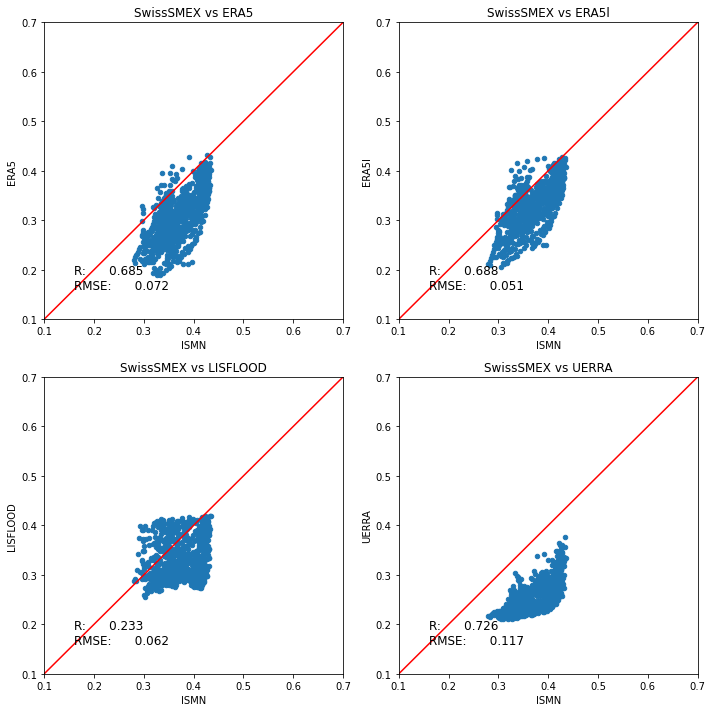

In [28]:
# create scatterplot
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
collist = ['ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']

scattermerged = anom_merged

# scattermerged[scattermerged.isnull().any(axis=1)] = np.nan
scattermerged = scattermerged.dropna(axis=0)

pearsonr = scattermerged.corr()

for i in range(4):
    if anomalies:
        plotlims = [-2.5, 2.5]
    else:
        plotlims = [0.1, 0.7]
    scattermerged.plot.scatter(x='ISMN', y=collist[i], ax=axs[np.unravel_index(i, (2, 2))],
                               title='SwissSMEX vs ' + collist[i],
                               xlim=plotlims, ylim=plotlims)
    # calculate rmse
    rmse = ((scattermerged[collist[i]] - scattermerged['ISMN']) ** 2).mean() ** .5
    axs[np.unravel_index(i, (2, 2))].text(0.1, 0.1,
                                          "R: " + "{:10.3f}".format(pearsonr['ISMN'][collist[i]]) + '\n' +
                                          "RMSE: " + "{:10.3f}".format(rmse),
                                          transform=axs[np.unravel_index(i, (2, 2))].transAxes,
                                          size='large')
    line = mlines.Line2D([0, 1], [0, 1], color='red')
    transform = axs[np.unravel_index(i, (2, 2))].transAxes
    line.set_transform(transform)
    axs[np.unravel_index(i, (2, 2))].add_line(line)

fig.tight_layout()

### Individual WEGENERNET stations <a class="anchor" id="wegener_ind"></a>
#### P1

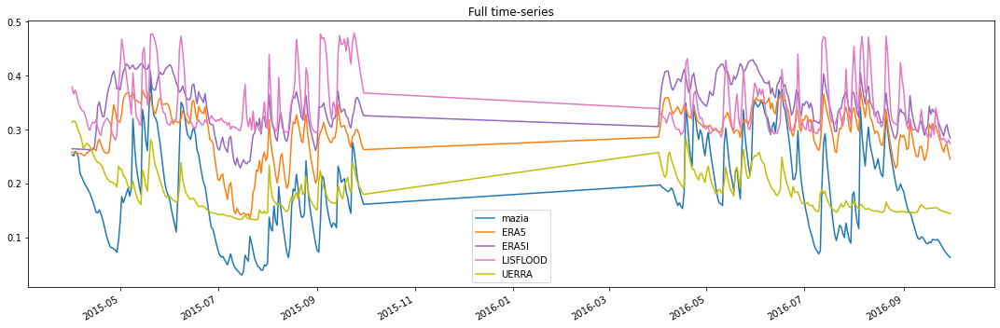

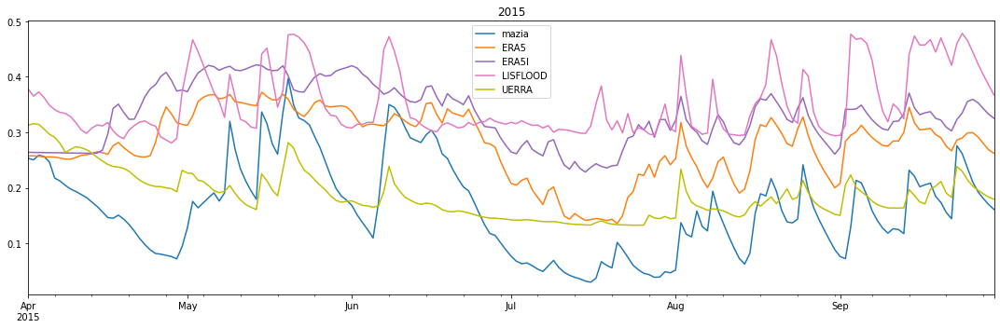

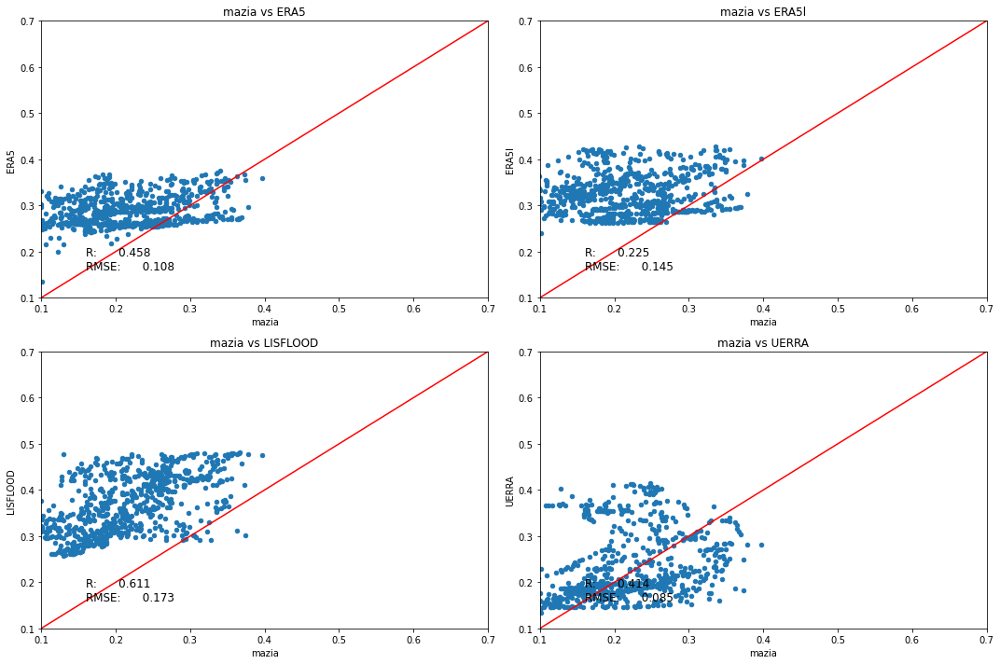

In [29]:
from model_comparison import Mazia_ts_validation

# settings
interval = 1
monthly=True
anomalies=False
year = [2015]

i_station = "P1"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])
all_stations = merged.copy()
all_stations.columns = mindex

#### P2

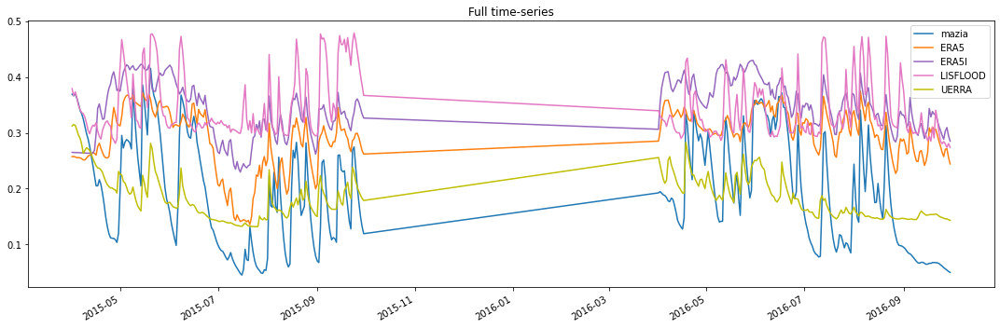

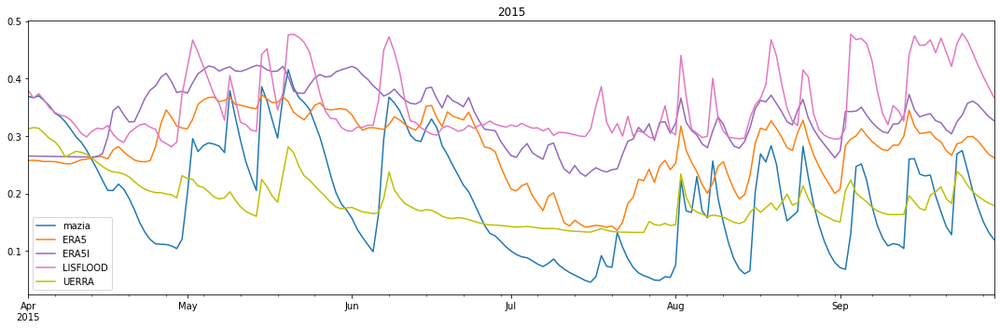

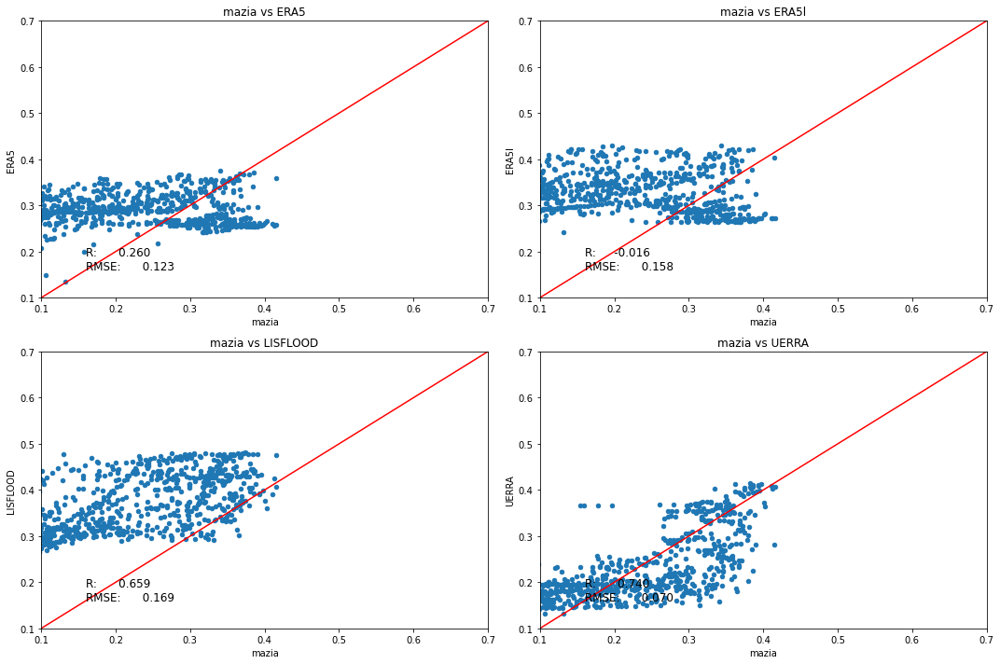

In [30]:
i_station = "P2"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### P3

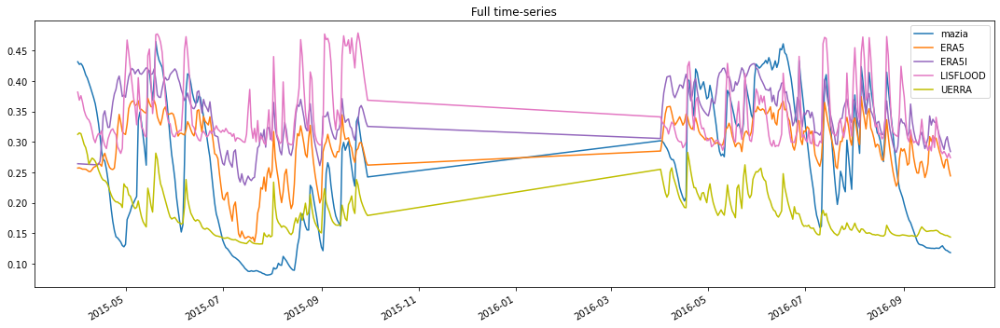

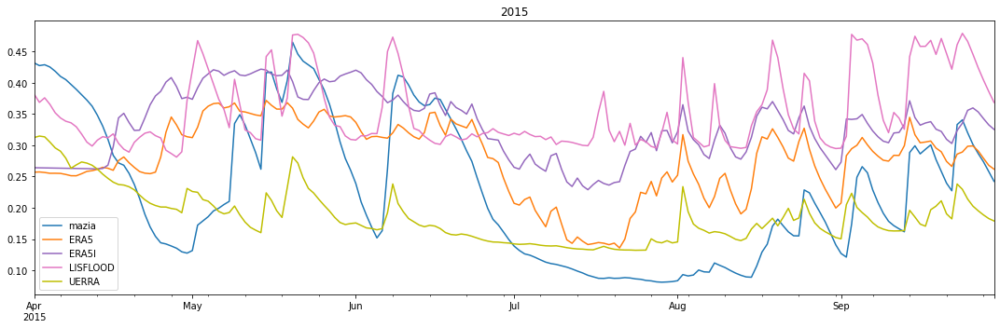

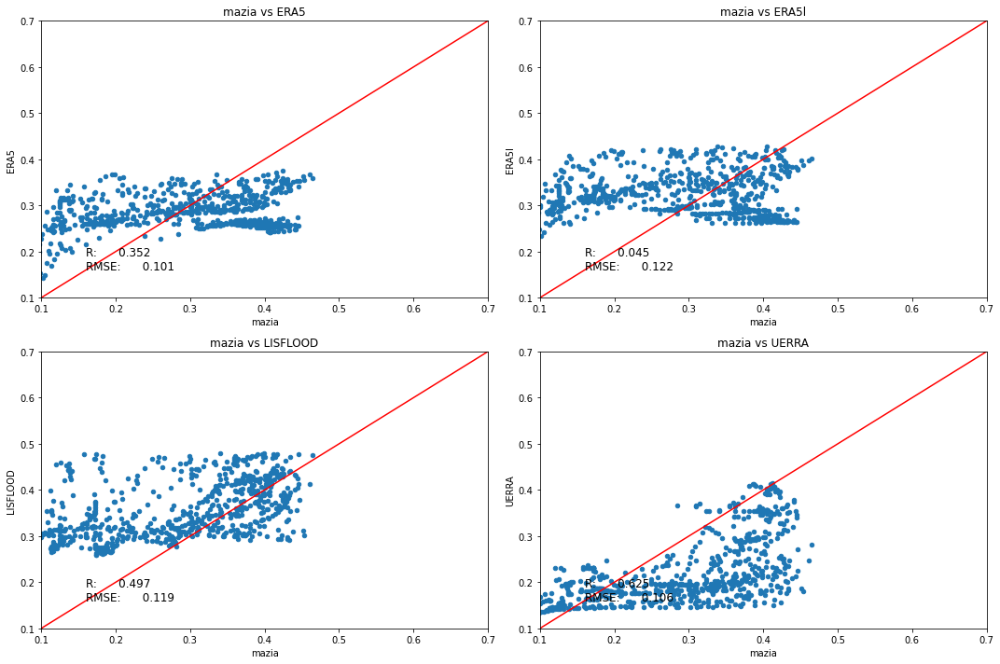

In [31]:
i_station = "P3"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### I1

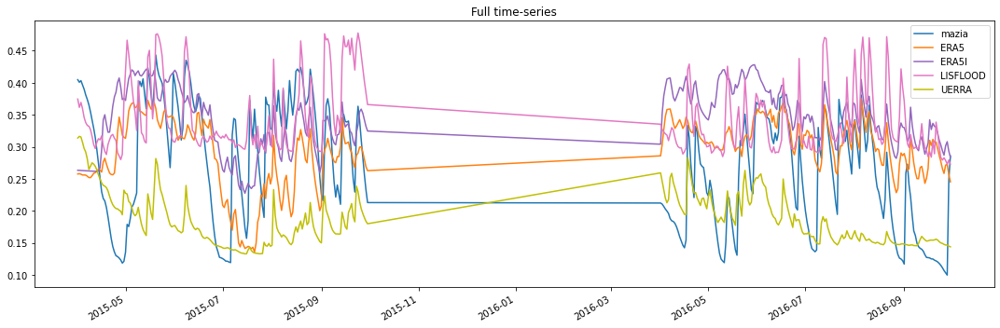

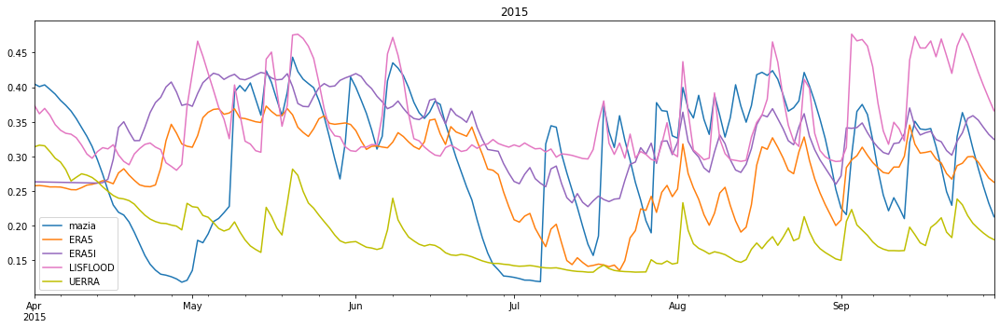

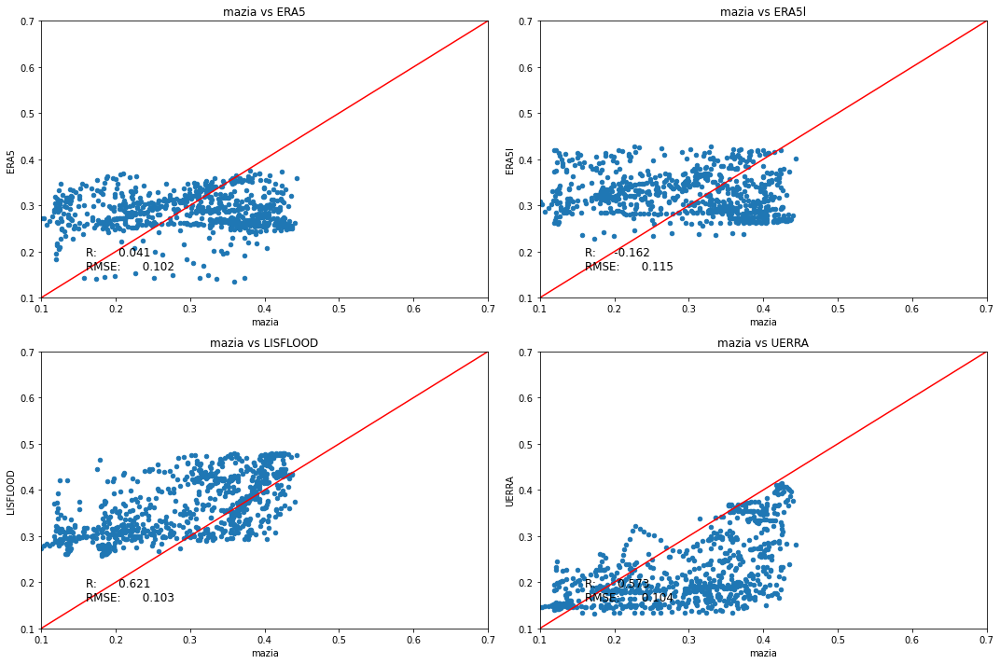

In [32]:
i_station = "I1"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### I3

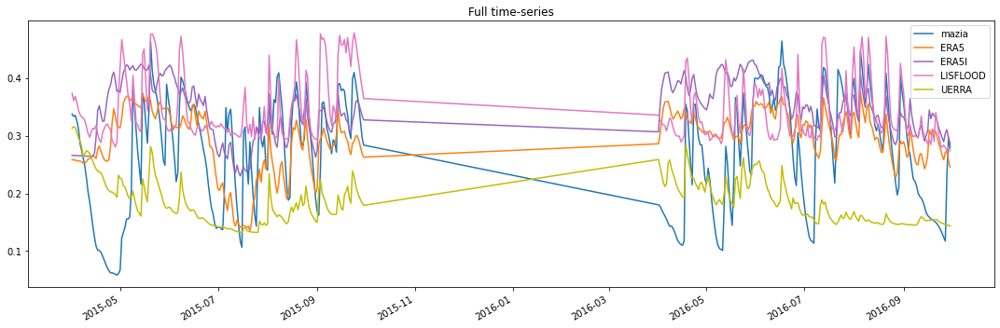

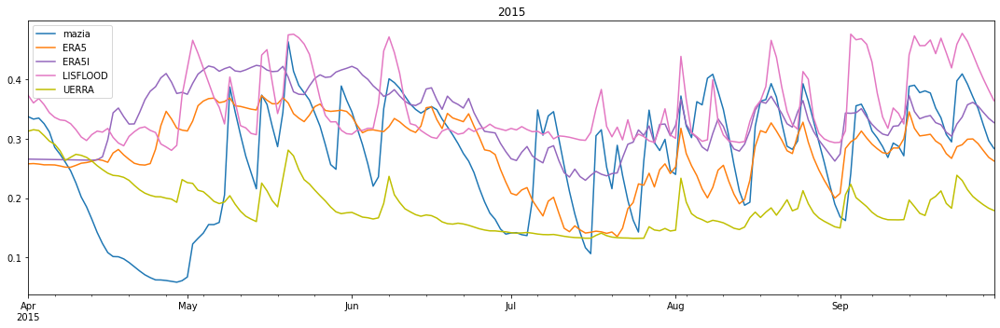

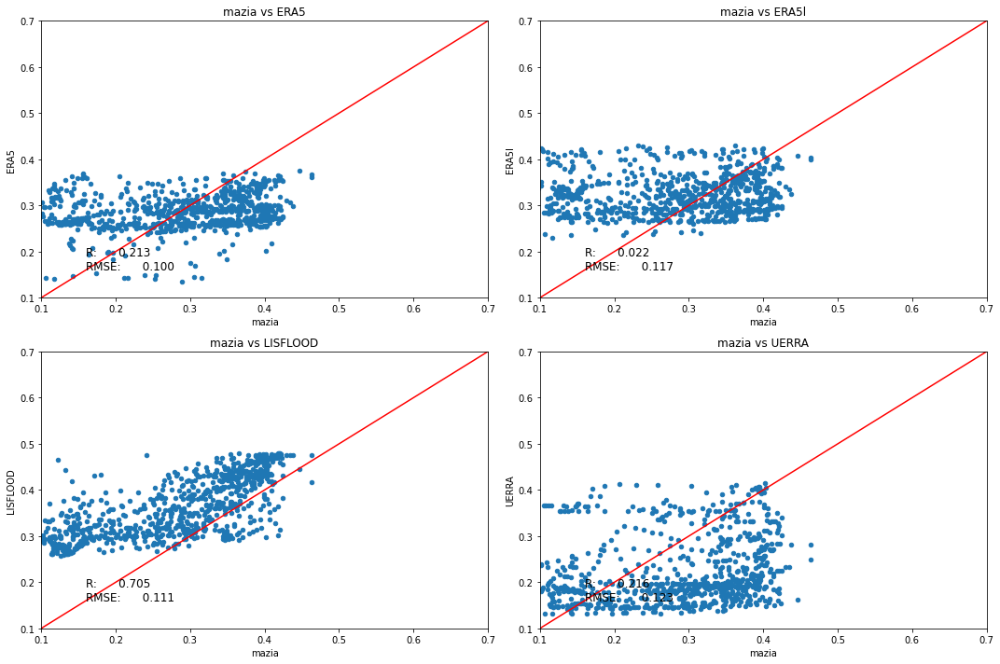

In [33]:
i_station = "I3"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### B2

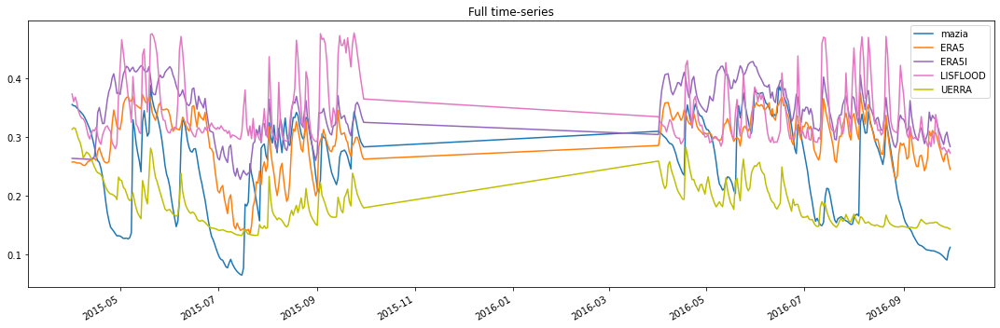

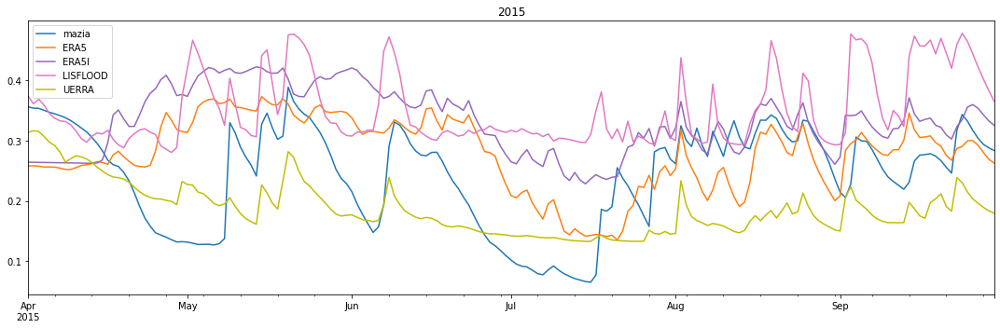

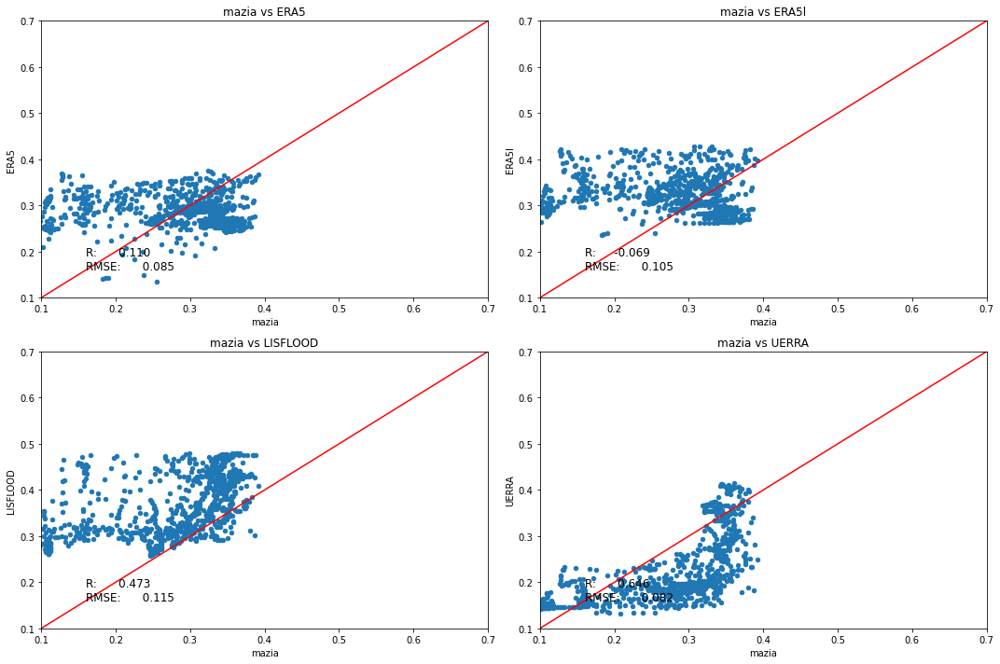

In [34]:
i_station = "B2"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### B3

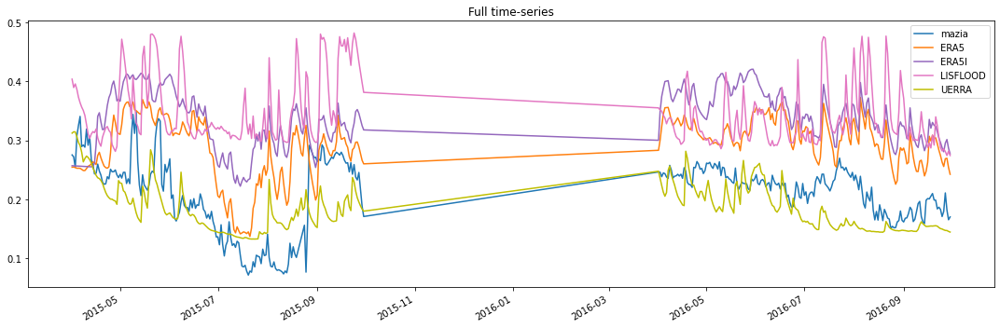

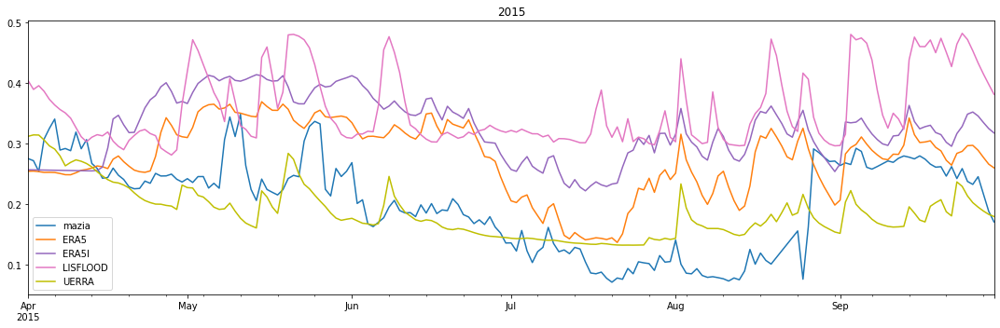

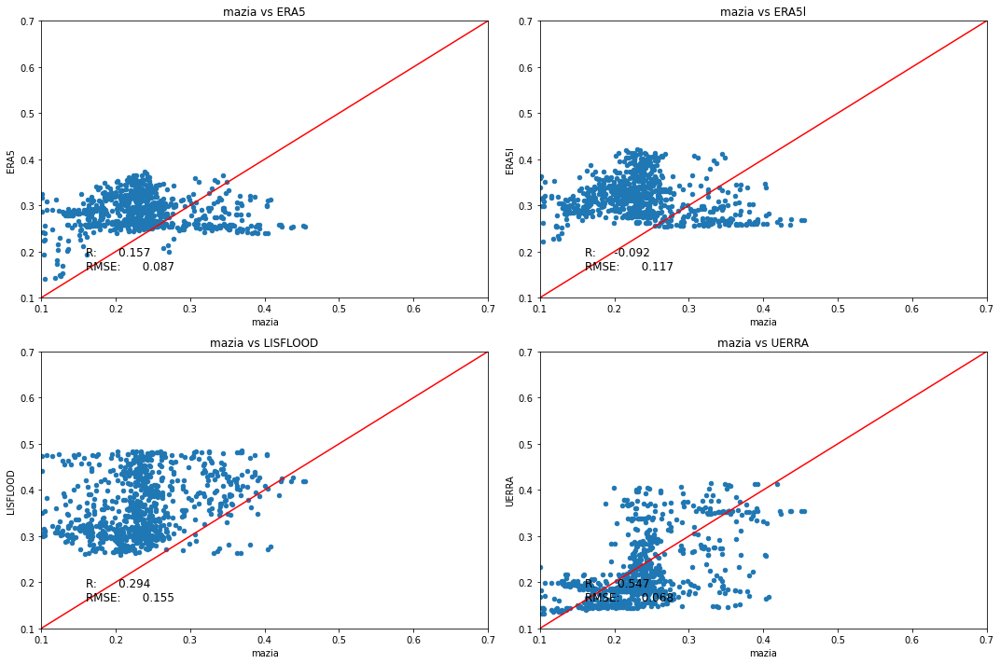

In [35]:
i_station = "B3"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### M1

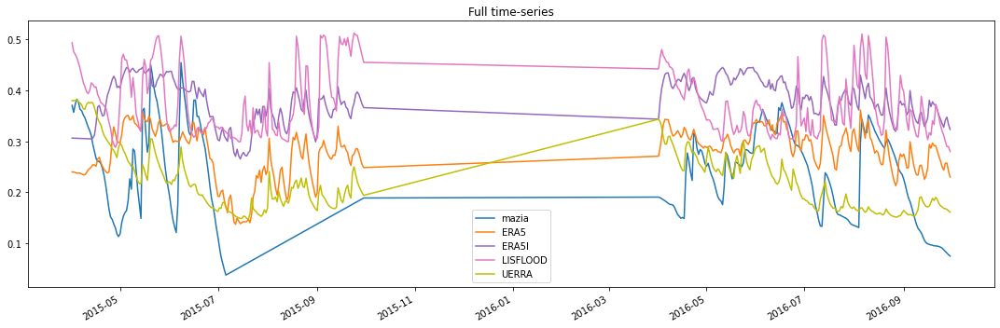

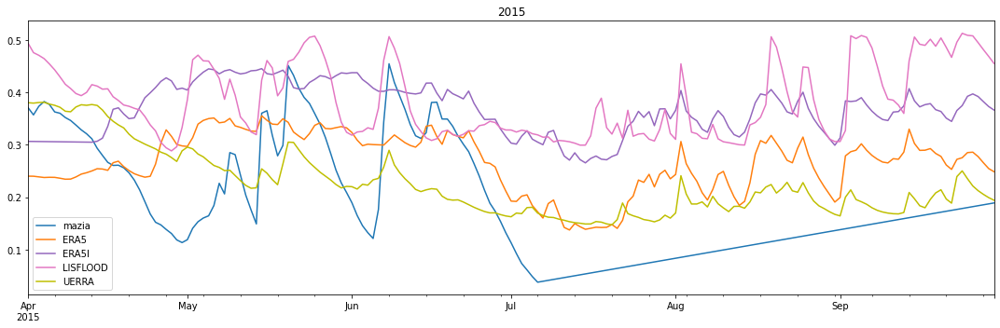

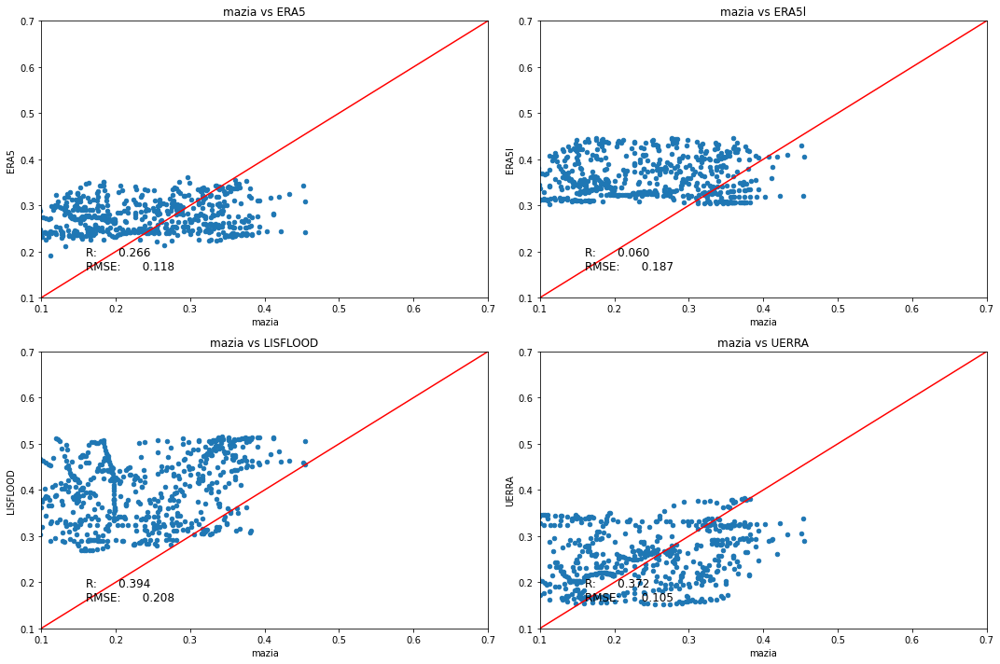

In [36]:
i_station = "M1"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### M2

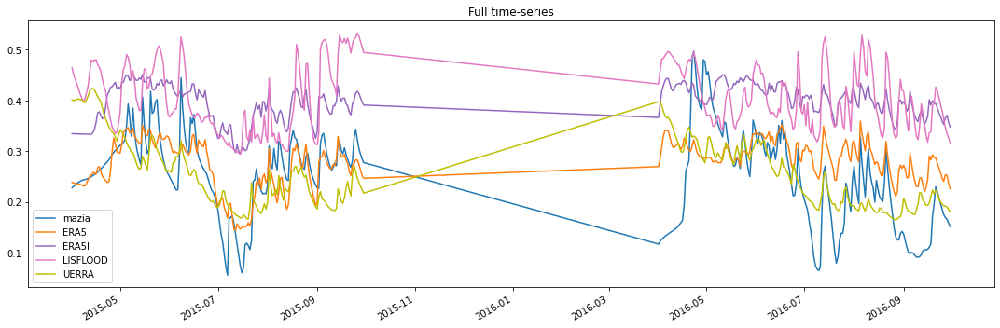

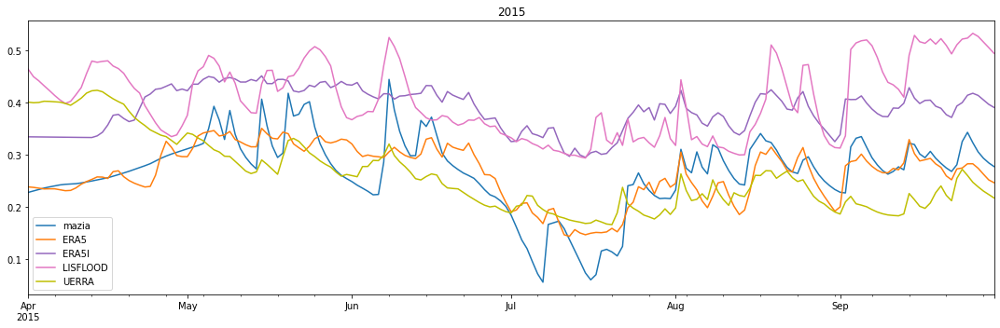

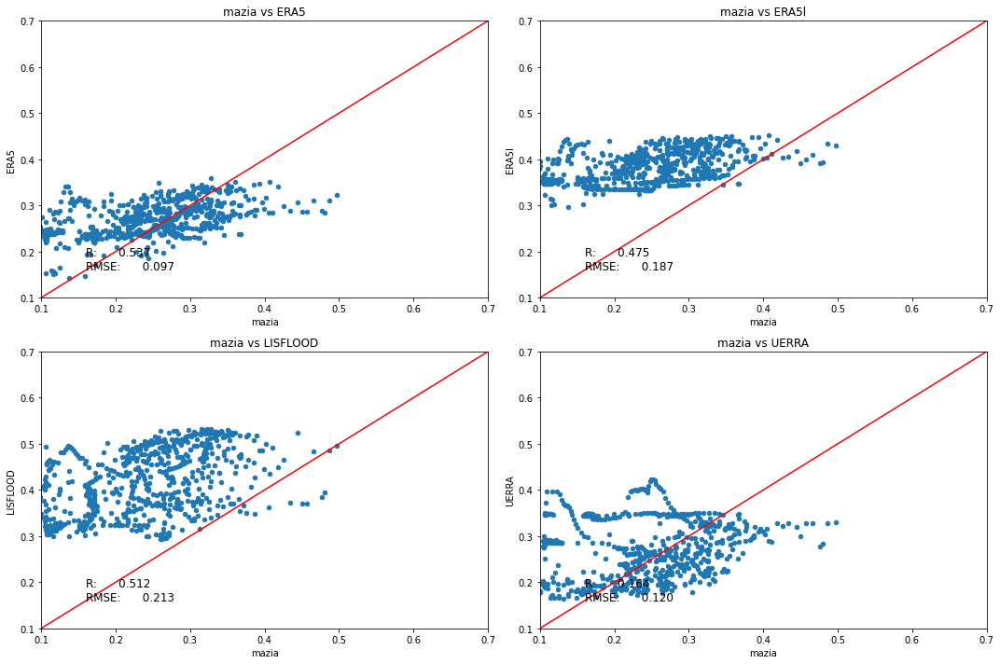

In [37]:
i_station = "M2"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### M6

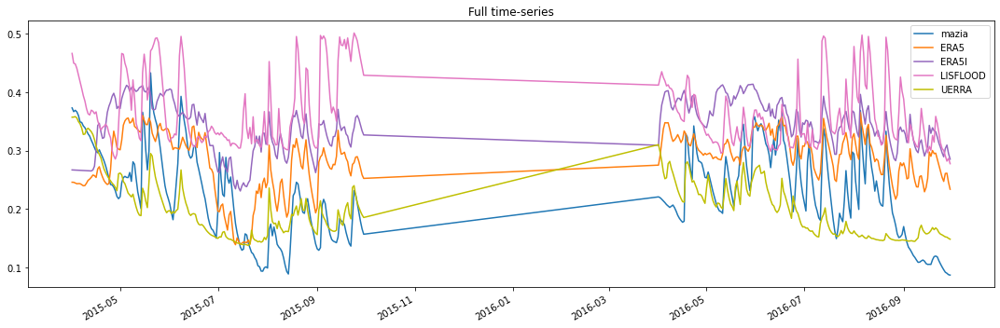

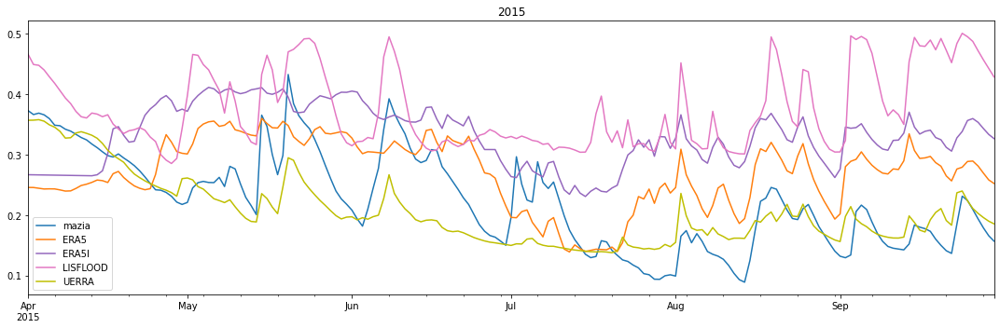

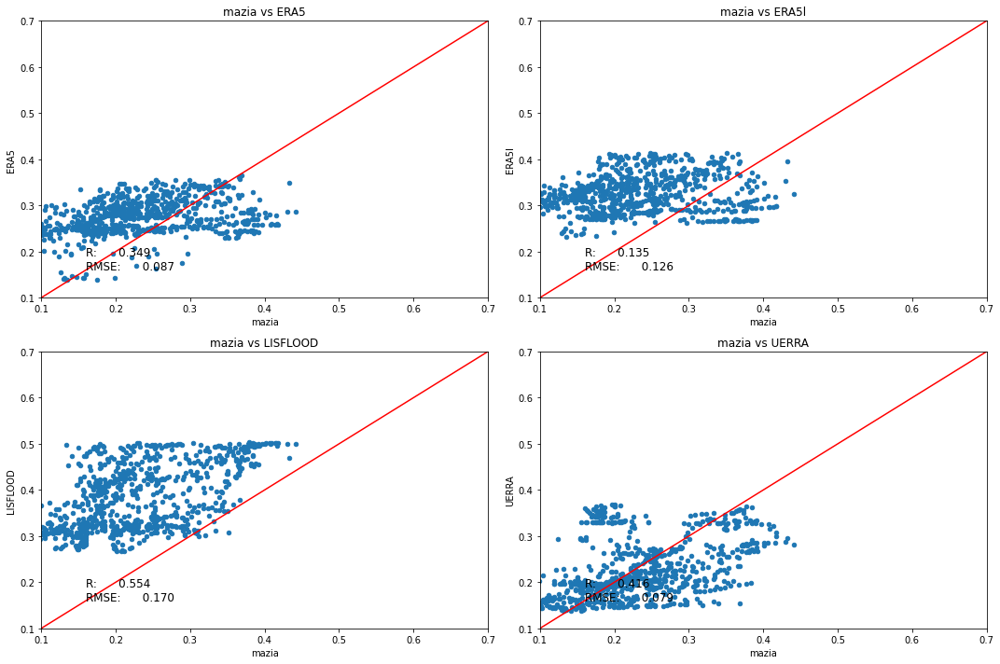

In [38]:
i_station = "M6"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### S4

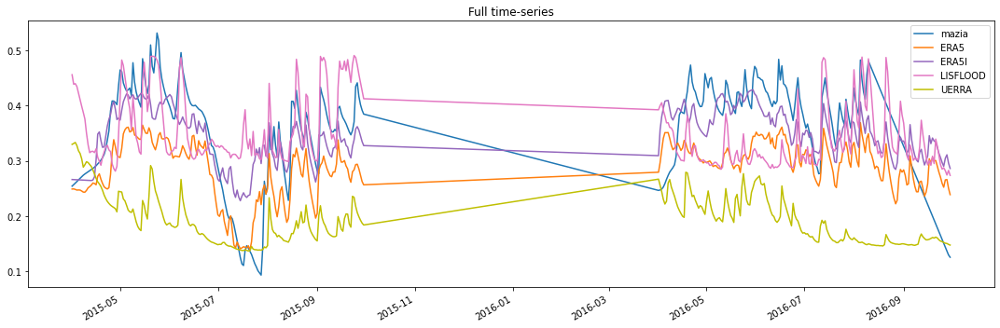

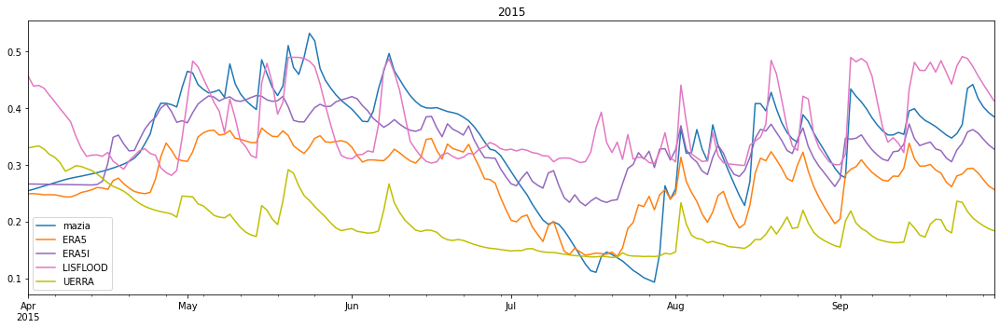

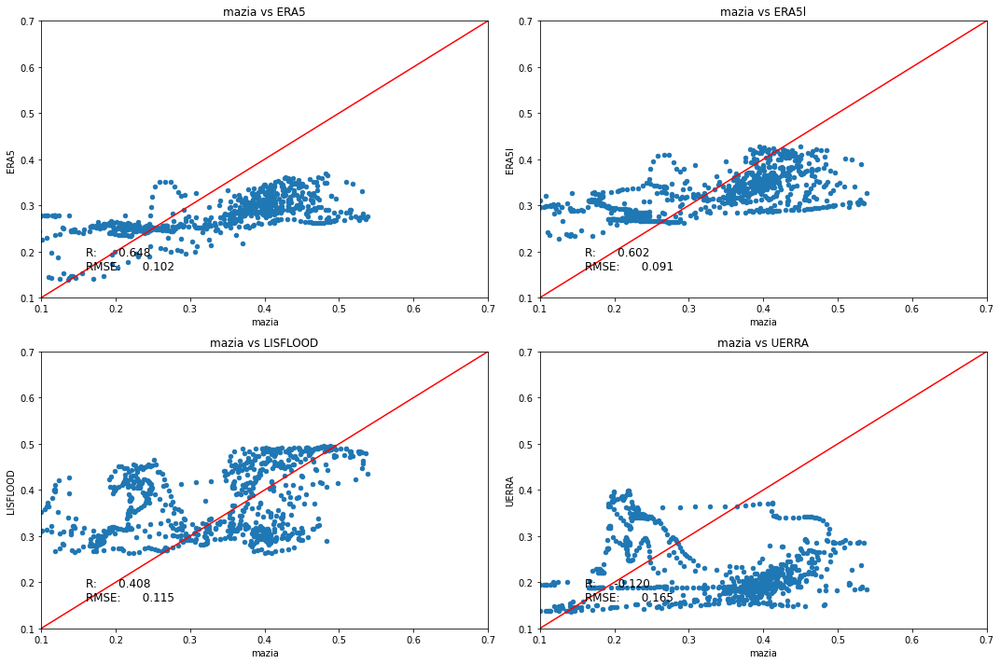

In [39]:
i_station = "S4"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

#### XS6

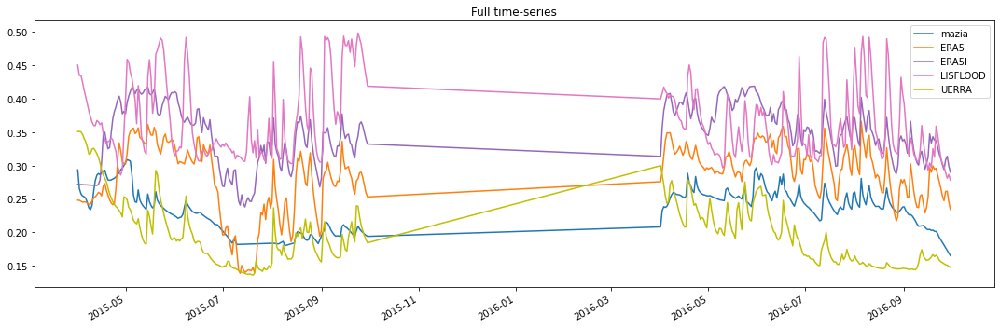

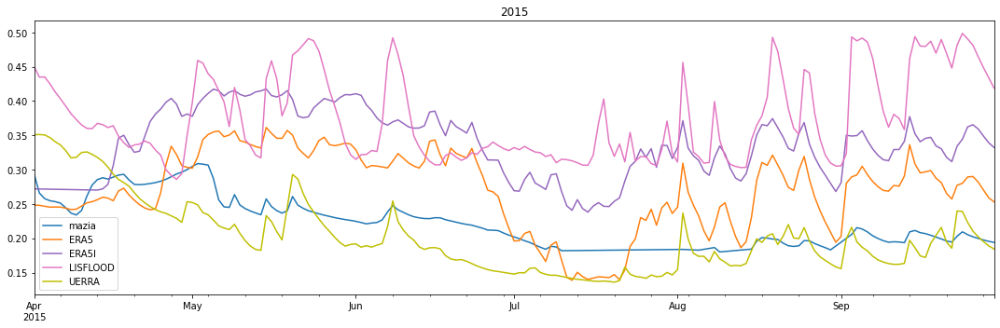

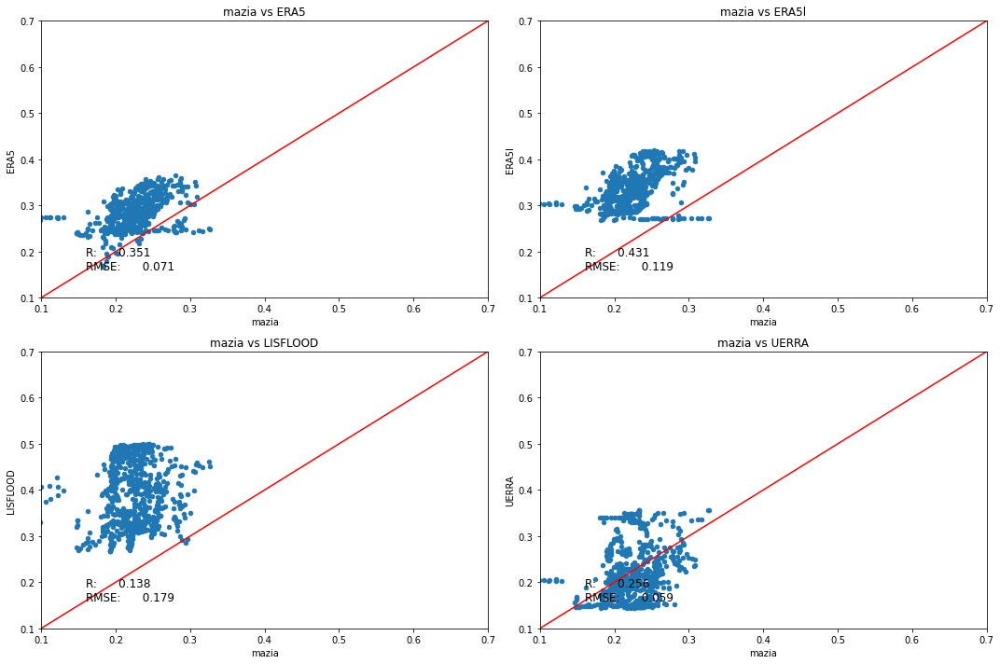

In [40]:
i_station = "XS6"
anom_merged, merged = Mazia_ts_validation(ERA5, ERA5l,
                                         LISFLOOD,
                                         UERRA,
                                         i_station,
                                         interval,
                                         year=year, anomalies=anomalies)

mindex = pd.MultiIndex.from_tuples([(i_station, i) for i in anom_merged.columns])

tmp = merged.copy()
tmp.columns = mindex
all_stations = pd.concat([tmp, all_stations], axis=1)

### Average Conditions Mazia <a class="anchor" id="wegenernet_overall"></a>
The plots below shows the time-series of average soil moisture

#### Time-series

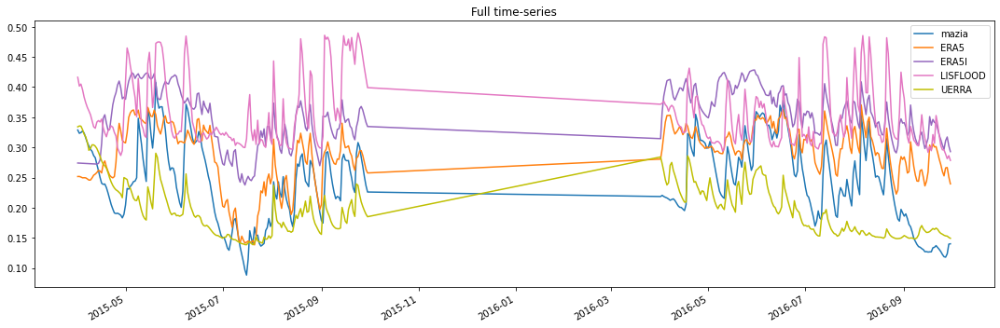

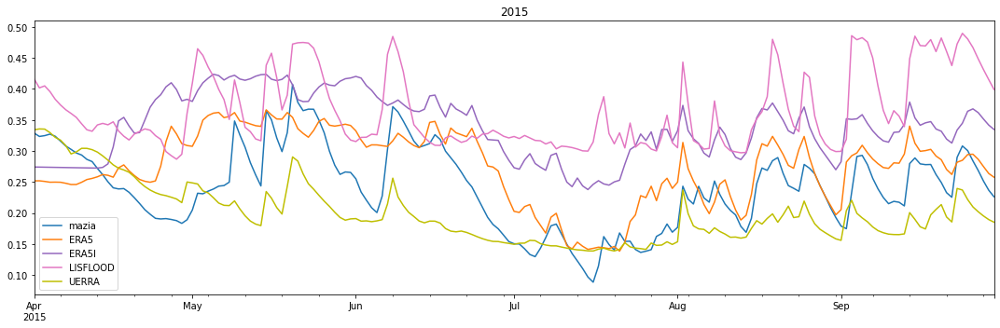

In [41]:
from model_comparison import plot_only_ts
import matplotlib.pyplot as plt
import numpy as np

avg_stations = all_stations.groupby(level=1, axis=1).mean()
anom_merged = plot_only_ts(avg_stations[
                               ['mazia', 'ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']
                           ], '', 'Average', year=[2012, 2015], anomalies=anomalies, monthly=True)

#### Scatterplots

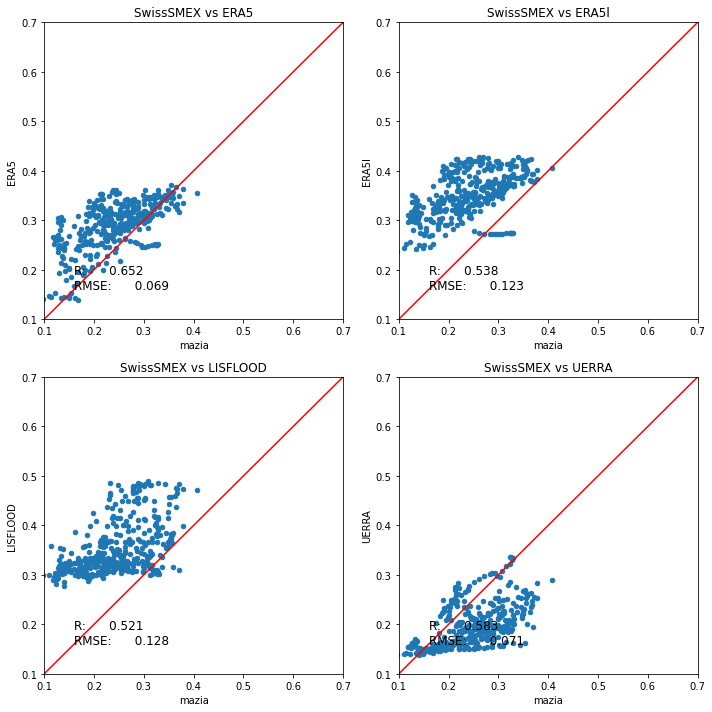

In [42]:
# create scatterplot
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
collist = ['ERA5', 'ERA5l', 'LISFLOOD', 'UERRA']

scattermerged = anom_merged

# scattermerged[scattermerged.isnull().any(axis=1)] = np.nan
scattermerged = scattermerged.dropna(axis=0)

pearsonr = scattermerged.corr()

for i in range(4):
    if anomalies:
        plotlims = [-2.5, 2.5]
    else:
        plotlims = [0.1, 0.7]
    scattermerged.plot.scatter(x='mazia', y=collist[i], ax=axs[np.unravel_index(i, (2, 2))],
                               title='SwissSMEX vs ' + collist[i],
                               xlim=plotlims, ylim=plotlims)
    # calculate rmse
    rmse = ((scattermerged[collist[i]] - scattermerged['mazia']) ** 2).mean() ** .5
    axs[np.unravel_index(i, (2, 2))].text(0.1, 0.1,
                                          "R: " + "{:10.3f}".format(pearsonr['mazia'][collist[i]]) + '\n' +
                                          "RMSE: " + "{:10.3f}".format(rmse),
                                          transform=axs[np.unravel_index(i, (2, 2))].transAxes,
                                          size='large')
    line = mlines.Line2D([0, 1], [0, 1], color='red')
    transform = axs[np.unravel_index(i, (2, 2))].transAxes
    line.set_transform(transform)
    axs[np.unravel_index(i, (2, 2))].add_line(line)

fig.tight_layout()

## Observations
* Based on the soil moisture conditions of single stations,
SMAs based on ERA5 showed the best correlations (on average) with in-situ measurements.
* Higher spatial resolution does not lead to more accurate SMAs - ERA5 performs well
even though it has, by far, the lowest spatial resolution.
* On average, all models can capture SMA dynamics similarly well.
* PREVAH, as a local hydrological model, outperforms ERA5, ERA5-L, LISFLOOD,
and UERRA, but not by much.
* The results presented in Table 2 show significantly better correlations for SwissSMEX
compared to the other in-situ networks.
* For Wegenernet, LISFLOOD performs significantly worse than the other models.
* Scatterplots show a clear linear relationship between in-situ measurements and
modelled SMAs.
* The level of noise is high for all models, which hinders an accurate quantification of
local anomalies.
* Absolute accuracies differ between the different soil moisture networks. A more
careful look at the uncertainties of in-situ measurements is required to draw final
conclusions.